
# HypergraphPercol (K=2) on Italian Olive Oil and SIPU Benchmarks

This Colab notebook reproduces the experiments for **HypergraphPercol** with triangle connectivity (K=2) on two benchmarks:
1) **Italian Olive Oil** (572 samples, 8 features)  
2) **SIPU Clustering Benchmarks** (2D synthetic datasets)

It uses **gdown** to fetch the datasets from Google Drive.  


In [ ]:

# ================================================================
# Environment setup
# - Installs required libraries.
# ================================================================

!pip -q install gdown pyreadr miniball gudhi genieclust clustering-benchmarks matplotlib seaborn


  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 418.3/418.3 kB 22.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 69.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.2/6.2 MB 94.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.5/6.5 MB 84.4 MB/s eta 0:00:00


In [ ]:

# ================================================================
# Download data from Google Drive using gdown
# ================================================================

import os, shutil, gdown

BASE_DIR = "/content"
DATA_DIR = os.path.join(BASE_DIR, "data")
FIG_DIR  = os.path.join(BASE_DIR, "figures", "SIPU")
os.makedirs(DATA_DIR, exist_ok=True)
os.makedirs(FIG_DIR, exist_ok=True)

OLIVE_ID = "1MIKor5RJJsrqNWdo_BxqJFHKQw4eGdMS" # "176q9UosnTZF9xjbT3162giDqx9seMRpr"
SIPU_ID  = "1LaMvl2n9EUunWevCKLGwl5118radp6Wv"

olive_dst = os.path.join(DATA_DIR, "oliveoil.rda")
sipu_dst_zip = os.path.join(BASE_DIR, "clustering-data-v1-master.zip")

print("Downloading olive oil dataset ...")
gdown.download(id=OLIVE_ID, output=olive_dst, quiet=False)

print("Downloading SIPU benchmark zip ...")
gdown.download(id=SIPU_ID, output=sipu_dst_zip, quiet=False)

# shutil.copy(olive_dst, os.path.join(DATA_DIR, "oliveoil.rda"))

print("Files ready in:", DATA_DIR)


Downloading...
From: https://drive.google.com/uc?id=1MIKor5RJJsrqNWdo_BxqJFHKQw4eGdMS
To: /content/data/oliveoil.rda
100%|██████████| 7.50k/7.50k [00:00<00:00, 11.1MB/s]


Downloading...
From (original): https://drive.google.com/uc?id=1LaMvl2n9EUunWevCKLGwl5118radp6Wv
From (redirected): https://drive.google.com/uc?id=1LaMvl2n9EUunWevCKLGwl5118radp6Wv&confirm=t&uuid=3febc334-6be0-4e56-bd47-446bbc5570ba
To: /content/clustering-data-v1-master.zip
100%|██████████| 99.1M/99.1M [00:01<00:00, 83.6MB/s]

Files ready in: /content/data


In [ ]:

# ================================================================
# Unzip the SIPU archive
# ================================================================
%%bash
unzip -q clustering-data-v1-master.zip
echo "Top-level directory after unzip:"
ls -la
echo ""
echo "Inspecting the 'clustering-data-v1-master' folder:"
ls -la clustering-data-v1-master | head -n 40


Top-level directory after unzip:
total 96820
drwxr-xr-x  1 root root     4096 Nov  2 12:45 .
drwxr-xr-x  1 root root     4096 Nov  2 12:33 ..
drwxr-xr-x 13 root root     4096 Oct 22  2023 clustering-data-v1-master
-rw-r--r--  1 root root 99114482 Oct 28 11:28 clustering-data-v1-master.zip
drwxr-xr-x  4 root root     4096 Oct 30 13:36 .config
drwxr-xr-x  2 root root     4096 Nov  2 12:45 data
drwxr-xr-x  3 root root     4096 Nov  2 12:45 figures
drwxr-xr-x  1 root root     4096 Oct 30 13:36 sample_data

Inspecting the 'clustering-data-v1-master' folder:
total 124
drwxr-xr-x 13 root root  4096 Oct 22  2023 .
drwxr-xr-x  1 root root  4096 Nov  2 12:45 ..
drwxr-xr-x 11 root root  4096 Oct 22  2023 .catalogue
drwxr-xr-x  2 root root  4096 Oct 22  2023 .devel
drwxr-xr-x  2 root root  4096 Oct 22  2023 fcps
drwxr-xr-x  2 root root 16384 Oct 22  2023 g2mg
-rw-r--r--  1 root root   444 Oct 22  2023 .gitignore
drwxr-xr-x  2 root root  4096 Oct 22  2023 graves
drwxr-xr-x  2 root root 16384 Oct 22

In [ ]:

# ================================================================
# Imports, global constants, and configuration
# ================================================================
import numpy as np
!pip install gudhi
from gudhi import SimplexTree, AlphaComplex

import pyreadr
import miniball

from scipy.sparse import coo_array
from scipy.sparse.csgraph import minimum_spanning_tree, connected_components

import hdbscan

from sklearn.cluster import _hierarchical_fast
from sklearn.preprocessing import normalize
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import adjusted_rand_score

from numpy import ceil, floor, sqrt

import genieclust
import clustbench

import matplotlib.pyplot as plt
import seaborn as sns
import os.path

# A global constant
Infini = float("inf")

# Paths
BASE_DIR = "/content"
DATA_DIR = os.path.join(BASE_DIR, "data")
FIG_DIR  = os.path.join(BASE_DIR, "figures", "SIPU")

folder_OliveOil = os.path.join(DATA_DIR, "")
SIPU_path = BASE_DIR
data_path = os.path.join(SIPU_path, "clustering-data-v1-master", "")
folder_SIPU_results = os.path.join(FIG_DIR, "")

compute_OliveOil_clustering = True
compute_SIPU_clusterings    = True

plt.rcParams["figure.figsize"] = (6, 5)
plt.rcParams["axes.grid"] = False

print("Data path:", data_path)
print("Figures will be saved to:", folder_SIPU_results)


/usr/local/lib/python3.12/dist-packages/hdbscan/robust_single_linkage_.py:175: SyntaxWarning: invalid escape sequence '\{'
  $max \{ core_k(a), core_k(b), 1/\alpha d(a,b) \}$.


Data path: /content/clustering-data-v1-master/
Figures will be saved to: /content/figures/SIPU/



## Method overview (triangle connectivity, K = 2)

We run the **HypergraphPercol** variant specialized to triangles (K = 2). In summary:

- Build a **Čech/Alpha complex** on the point set and extract **Gabriel triangles**.  
  Acute cases come from the Delaunay triangulation; obtuse cases are detected by
  checking nearest neighbors of midpoints of the longest edges.
- Convert the simplicial complex into a graph over (K−1)-simplices and compute
  a **minimum spanning tree** at the simplex level.
- Turn the simplex-level hierarchy into a **point-level single-linkage tree**,
  then select clusters with the **HDBSCAN EOM** criterion and a minimum cluster
  size (the percolation threshold).


In [ ]:
def ČechTrianglesComponents(M, PercolThreshold=10, expZ=1, verbeux=False) :

    n,p = M.shape

    IndArête_vers_Couple = []
    Couple_vers_IndArête = {}
    TrianglesGabriel = set()

    AdjacenceDelaunay = {i:set() for i in range(n)}

    # First part : the 'acute' Gabriel triangles
    # => regarder tous les triangles de Delaunay ; tester s'ils sont de Gabriel en prenant leur centre et en vérifiant que ses 3-PPV  sont les 3 sommets
    # 1°) Les 3-PPV
    PPV = NearestNeighbors(n_neighbors=3).fit(M)

    if verbeux :
        print("Calcul de la triangulation de Delaunay.")
    α = AlphaComplex(points=M)#, precision='exact') #  can be ‘fast’, ‘safe’ or ‘exact’ # 'safe' = 1e^-5
    if verbeux :
        print("α-complexe calculé.")
    ST = α.create_simplex_tree(max_alpha_square=np.inf, default_filtration_value=True)
    if verbeux :
        print("Simplex-Tree calculé.", ST.num_simplices()," simplexes.")

    SimplexesDelaunay = ST.get_skeleton(2)
    compteur_triangles = 0
    if verbeux :
        print("Skeleton de dimension K=2 calculé")

    ČechTriangles = SimplexTree()

    for simplexe,_ in SimplexesDelaunay :
        if len(simplexe) == 3 :
            compteur_triangles += 1
            p1,p2,p3 = simplexe
            AdjacenceDelaunay[p1].add(p2)
            AdjacenceDelaunay[p1].add(p3)
            AdjacenceDelaunay[p2].add(p1)
            AdjacenceDelaunay[p2].add(p3)
            AdjacenceDelaunay[p3].add(p1)
            AdjacenceDelaunay[p3].add(p2)

            if not (p1,p2,p3) in TrianglesGabriel :
                points = np.array([M[p1,:],M[p2,:],M[p3,:]])
                centre, r2 = miniball.get_bounding_ball(points)#, epsilon=1e-9) # , epsilon=1e-7 par défaut
                r = sqrt(r2)
                ppv_centre = PPV.kneighbors([centre], return_distance=False)
                # print(ppv_centre)
                a,b,c = sorted((ppv_centre[0,0], ppv_centre[0,1], ppv_centre[0,2])) # les 3 Plus Proches Voisins

                if (a,b,c) == (p1,p2,p3) : #  Gabriel triangle !
                    TrianglesGabriel.add((a,b,c))
                    ČechTriangles.insert([a,b,c],filtration=r)

    if verbeux :
        print(compteur_triangles, " triangles étaient présents dans le Skeleton.")
        print(len(TrianglesGabriel), " triangles de Gabriel.")

    # Uncomment this part for the exact refinement on obtuse triangles.
    # On Olive Oil Dataset, the results are left unchanged
    # Second Part: The 'obtuse' Gabriel triangles
    # On passe en revue toutes les arêtes possibles. Si les deux plus proches voisins du centres correspondent à 1 autre point + 1 une extrêmité, c'est gagné !
    # Plus optimisé : les "petites" arêtes d'un triangle obtus sont forcément dans la triangulation de Delaunay
    for p1 in range(n) :
        liste_points = AdjacenceDelaunay[p1]
        for p2 in liste_points :
            for p3 in liste_points :
                a,b,c = sorted((p1,p2,p3))
                if p2 < p3 and not (a,b,c) in TrianglesGabriel :
                    centre = (M[p2,:] + M[p3,:])/2
                    r = np.linalg.norm(M[p2,:] - M[p3,:])/2
                    ppv_centre = PPV.kneighbors([centre], n_neighbors=2, return_distance=False)
                    k,l = ppv_centre[0,0], ppv_centre[0,1]
                    if p1 in (k,l) and (p2 in (k,l) or p3 in (k,l)) :
                        TrianglesGabriel.add((a,b,c))
                        ČechTriangles.insert([a,b,c],filtration=r)

    if verbeux :
        print("Avec les triangles obtus qui restaient, on a maintenant :")
        print(len(TrianglesGabriel), " triangles de Gabriel pour ", ČechTriangles.num_simplices(), " simplexes (points + arêtes + triangles).")

    labels, Filtrations = SimplexeTree_vers_KPolyèdresHiérarchiques(ČechTriangles, K=2, PercolThreshold=PercolThreshold, expZ=expZ, verbeux=verbeux)

    return labels


def SimplexeTree_vers_KPolyèdresHiérarchiques(ST, K=2, PercolThreshold=10, expZ=False, verbeux=False, n=None) :
    if n == None :
        n = ST.num_vertices()

    print(n)

    # For the (K-1)-Simplexes
    IndSimplexes_vers_Simplexes = []
    Simplexes_vers_IndSimplexes = {}

    DistancesSimplexes_row = []
    DistancesSimplexes_col = []
    DistancesSimplexes_data = []

    Filtrations_points = [[] for _ in range(n)]


    Simplexes = ST.get_skeleton(K)
    compteur_simplexes = 0
    nbSimplexes = 0
    if verbeux :
        print("Skeleton de dimension K=",K," calculé")

    for simplexe,r in Simplexes :
        if len(simplexe) == K+1 :
            compteur_simplexes += 1
            IndArêtes = []
            for i in simplexe :
                k_1_simplexe = simplexe.copy()
                k_1_simplexe.remove(i)
                k_1_simplexe = tuple(k_1_simplexe)
                if k_1_simplexe in Simplexes_vers_IndSimplexes :
                    indice = Simplexes_vers_IndSimplexes[k_1_simplexe]
                else :
                    indice = nbSimplexes
                    nbSimplexes += 1
                    Simplexes_vers_IndSimplexes[k_1_simplexe] = indice
                    IndSimplexes_vers_Simplexes.append(k_1_simplexe)
                IndArêtes.append(indice)

            # On ajoute les distances entre arêtes
            for IndArête1 in IndArêtes :
                for i in IndSimplexes_vers_Simplexes[IndArête1] :
                    Filtrations_points[i].append((r,IndArête1))

            IndArête1 = min(IndArêtes)
            IndArêtes.remove(IndArête1)
            for IndArête2 in IndArêtes :
                if IndArête2 > IndArête1 :
                    DistancesSimplexes_row.append(IndArête1)
                    DistancesSimplexes_col.append(IndArête2)
                    DistancesSimplexes_data.append(r)

    if verbeux :
        print("Complexe aux ",compteur_simplexes, "K-simplexes (arêtes du graphe) et aux ", nbSimplexes, "K-1 simplexes (servant de nœuds). Faisant un total de ", len(DistancesSimplexes_data), " arêtes (comptées avec multiplicité.")

    distancesSimplexes = coo_array((DistancesSimplexes_data, (DistancesSimplexes_row, DistancesSimplexes_col)), shape=(nbSimplexes, nbSimplexes), dtype=float)
    if verbeux :
        print("Matrice des distances calculées.")

    nbCompo, labels = connected_components(distancesSimplexes)
    if verbeux :
        print(nbCompo, ' composantes connexes.')

    nombres = [0 for _ in range(nbCompo)]
    v_max,ind_max = -1,-1
    for i,l in enumerate(labels) :
        nombres[l] += 1
        if nombres[l] > v_max :
            v_max = nombres[l]
            ind_max = l
    if verbeux :
        print("Fait.")
    indices_points_classés = set()
    indices_simplexes = {}
    nouv_ind_simplexe = 0
    Liste_nouv_simplexes = []
    for i,l in enumerate(labels) :
        if l == ind_max :
            indices_simplexes[i] = nouv_ind_simplexe
            Liste_nouv_simplexes.append(i)
            nouv_ind_simplexe += 1
            for p in IndSimplexes_vers_Simplexes[i] :
                indices_points_classés.add(p)
    if verbeux :
        print("Seuls ", len(indices_points_classés), " points apparaissent dans la plus grande composante connexe pour ", len(Liste_nouv_simplexes), " simplexes.")

    for i in range(n) :
        if not i in indices_points_classés :
            Filtrations_points[i] = [(Infini, -1)]
        else :
            filtr_i = []
            for r,simplexe in Filtrations_points[i] :
                if simplexe in indices_simplexes :
                    filtr_i.append((r,simplexe))
            Filtrations_points[i] = filtr_i

    for i in range(n) :
        if len(Filtrations_points[i]) > 0 :
            liste_arêtes = sorted(Filtrations_points[i])
            Filtrations_points[i] = liste_arêtes[0]
        else :
            Filtrations_points[i] = (Infini,-1)
        # Sinon c'est que le points n'est pas classé

    Liste_nouv_ind_points = []
    nouv_ind = 0
    Dict_ancien_ind_points = {}

    for i in range(n) :
        if i in indices_points_classés :
            Liste_nouv_ind_points.append(i)
            Dict_ancien_ind_points[i] = nouv_ind
            nouv_ind += 1

    DistancesSimplexes_row2 = []
    DistancesSimplexes_col2 = []
    DistancesSimplexes_data2 = []
    for i,r in  enumerate(DistancesSimplexes_data) :
        if DistancesSimplexes_row[i] in indices_simplexes and DistancesSimplexes_col[i] in indices_simplexes :
            DistancesSimplexes_row2.append(indices_simplexes[DistancesSimplexes_row[i]])
            DistancesSimplexes_col2.append(indices_simplexes[DistancesSimplexes_col[i]])
            DistancesSimplexes_data2.append(r)

    if verbeux :
        print("Nouveau complexe (connexe) aux ",compteur_simplexes, "K-simplexes (arêtes du graphe) et aux ", len(indices_simplexes), "K-1 simplexes (servant de nœuds). Faisant un total de ", len(DistancesSimplexes_data2), " arêtes (comptées avec multiplicité.")

    distancesSimplexes2 = coo_array((DistancesSimplexes_data2, (DistancesSimplexes_row2, DistancesSimplexes_col2)), shape=(len(indices_simplexes), len(indices_simplexes)), dtype=float)
    if verbeux :
        print("Matrice des distances calculées.")

    nbCompo, labels = connected_components(distancesSimplexes2)
    if verbeux :
        print(nbCompo, ' composantes connexes.')
        print(labels.shape, labels)
        print(np.sum(labels == 0))

    import scipy.sparse as sp

    def to_csr_float_with_int32_indices(A):
        """
        Convert a SciPy sparse COO *array* (coo_array) into a CSR *matrix* (csr_matrix)
        with:
        - data dtype: float64
        - index dtypes (indices, indptr): int32
        Assumes A is a well-formed COO array: attributes .data, .row, .col, .shape exist.

        Duplicates are summed and indices are sorted by the CSR conversion step.
        """
        # Build a COO *matrix* from the COO *array* payload
        coo = sp.coo_matrix(
            (A.data.astype(np.float64, copy=False),
            (A.row.astype(np.int32, copy=False),
            A.col.astype(np.int32, copy=False))),
            shape=A.shape
        )

        # COO -> CSR (sums duplicates, sorts indices)
        csr = coo.tocsr()

        # Ensure index arrays are int32 (some builds keep int64)
        if csr.indices.dtype != np.int32:
            csr.indices = csr.indices.astype(np.int32, copy=False)
        if csr.indptr.dtype != np.int32:
            csr.indptr = csr.indptr.astype(np.int32, copy=False)

        return csr
    distancesSimplexes2 = to_csr_float_with_int32_indices(distancesSimplexes2)
    mst2 = minimum_spanning_tree(distancesSimplexes2, overwrite=True)

    if verbeux :
        print("minimum_spanning_tree")

    # Convert the graph to scipy.cluster.hierarchy array format
    mst2 = mst2.tocoo()

    mst_array = np.vstack([mst2.row, mst2.col, mst2.data]).T
    if verbeux :
        print(mst_array.shape)

    mst_array = mst_array[np.argsort(mst_array.T[2], kind="mergesort"), :]

    if verbeux :
        print("mst_array")

    # Convert edge list into standard hierarchical clustering format
    Z_Simplexes = _hierarchical_fast._single_linkage_label(mst_array)

    if verbeux :
        print("Z_Simplexes")

    nouv_IndSimplexes_vers_Simplexes =  [IndSimplexes_vers_Simplexes[simplexe] for simplexe in Liste_nouv_simplexes]
    for i,simplexe in enumerate(nouv_IndSimplexes_vers_Simplexes) :
        nouv_simpl = []
        for point in simplexe :
            nouv_simpl.append(Dict_ancien_ind_points[point])
        nouv_simpl.sort()
        nouv_simpl = tuple(nouv_simpl)
        nouv_IndSimplexes_vers_Simplexes[i] = nouv_simpl
    nouv_Filtrations_points = [Filtrations_points[ind] for ind in Liste_nouv_ind_points]
    for i,(r,ind_simplexe) in enumerate(nouv_Filtrations_points) :
        if ind_simplexe == -1 or not ind_simplexe in indices_simplexes :
            nouv_Filtrations_points[i] = (Infini,-1)
        else :
            nouv_ind_simplexe = indices_simplexes[ind_simplexe]
            nouv_Filtrations_points[i] = (r,nouv_ind_simplexe)

    Z = SimplexGraph_to_PointGraph(Z_Simplexes,  nouv_Filtrations_points, verbeux)

    if verbeux :
        print("Z", Z.shape)

    if expZ != False :
        Z = transform_Z(Z, f=lambda x : x**expZ)
        if verbeux :
            print('Transformation appliquée :  r -> r^',expZ)


    SLT = hdbscan.plots.SingleLinkageTree(Z)

    if verbeux :
        print("SLT")
        # plt.figure()
        # CT = hdbscan._hdbscan_tree.condense_tree(Z, min_cluster_size=(PercolThreshold-1))
        # Classe_CT = hdbscan.plots.CondensedTree(CT)
        # Classe_CT.plot(select_clusters=True, selection_palette=sns.color_palette())
        # plt.show()

    (labels, probabilities, stabilities, condensed_tree, single_linkage_tree) = hdbscan.hdbscan_._tree_to_labels(
        X=None,
        single_linkage_tree=Z,
        min_cluster_size=(PercolThreshold-1),
        cluster_selection_method="eom",
        allow_single_cluster=False,
        match_reference_implementation=False,
        cluster_selection_epsilon=0.0,
        max_cluster_size=0,
    ) # le premier paramètre X n'est pas utilisé...

    if verbeux :
        print("Labels (partiels) calculés.")

    labels_anciens_num = -np.ones((n,), dtype=int)
    for i,lab in enumerate(labels) :
        labels_anciens_num[Liste_nouv_ind_points[i]] = lab

    return labels_anciens_num, Filtrations_points


def SimplexGraph_to_PointGraph(Z_simplexes, Filtrations_points, verbose=False) :
    N = Z_simplexes.shape[0] +1 # le nombre de simplexes
    n = len(Filtrations_points)
    if verbose :
        print(N, n)
        print(Z_simplexes)
    Z = []
    Clusters_activés = {} # Un dictionnaire qui associe à : un numéro de cluster actif (non vide en points) -> le numéro de cluster dans Z_retour
    Tailles_clusters = {}

    # 2 types de fusion : des classiques et les simplexes sontenant plusieurs points

    Rayons = [(Z_simplexes[i,2], N+i) for i in range(N-1)] # (rayon, i in {0,N-2}) ou (rayon, (p1,p2))
    for point, (r, num_simplexe) in enumerate(Filtrations_points) :
        Rayons.append((r,(point, num_simplexe)))

    Rayons.sort(key=lambda x : (isinstance(x[1], int), x[0]))

    i = 0
    for r,c in Rayons :
        if isinstance(c, int) : # (Z_simplexes[2], i)
            cluster1, cluster2 = round(Z_simplexes[c-N,0]), round(Z_simplexes[c-N,1])
            if (cluster1 in Clusters_activés) and (cluster2 in Clusters_activés) :
                nouv_taille = Tailles_clusters[cluster1] + Tailles_clusters[cluster2]
                Z.append([Clusters_activés[cluster1], Clusters_activés[cluster2], r, nouv_taille])
                Clusters_activés[c] = n + i
                Tailles_clusters[c] = nouv_taille
                i += 1
            elif cluster1 in Clusters_activés :
                Clusters_activés[c] = Clusters_activés[cluster1]
                Tailles_clusters[c] = Tailles_clusters[cluster1]
            elif cluster2 in Clusters_activés :
                Clusters_activés[c] = Clusters_activés[cluster2]
                Tailles_clusters[c] = Tailles_clusters[cluster2]
        else :
            p,num_simplexe = c
            if num_simplexe in Clusters_activés :
                nouv_taille = Tailles_clusters[num_simplexe] +1
                Z.append([p, Clusters_activés[num_simplexe], r, nouv_taille])
                Clusters_activés[num_simplexe] = n + i
                Tailles_clusters[num_simplexe] = nouv_taille
                i += 1
            else :
                Clusters_activés[num_simplexe] = p
                Tailles_clusters[num_simplexe] = 1

    Z = np.array(Z, dtype=float)
    if verbose :
        print(len(Clusters_activés),Z.shape)
        print(Z)

    return Z


def transform_Z(Z, f=lambda x : x**2) :
    N = len(Z)
    Z2 = np.copy(Z)
    for i in range(N) :
        Z2[i,2] = f(Z[i,2])
    return Z2


def charge_data() :
    result = pyreadr.read_r(folder_OliveOil+'oliveoil.rda')
    Données = result["oliveoil"]

    AcidesGras = ["palmitic","palmitoleic","stearic","oleic","linoleic","linolenic","arachidic","eicosenoic"]

    M = np.array(Données[AcidesGras])*1. # 572 * 8
    # Center M
    for i,_ in enumerate(AcidesGras) :
        M[:,i] -= np.mean(M[:,i], axis=0)
    # Normalize M
    M = normalize(M, norm='l2', axis=0)

    return M, Données


def CorrespClusterings(original, clustering) :
    # print(original, original.shape)
    n, = original.shape
    k = max(np.max(original), np.max(clustering)) +1
    σ = np.array(range(k), dtype=int)
    AnciennesCouleursClustering = set()
    NouvellesCouleurs = set()
    for i in range(n) :
        ancienne_couleur = clustering[i]
        if ancienne_couleur != 0 and not ancienne_couleur in AnciennesCouleursClustering :
            nouvelle_couleur = original[i]
            if nouvelle_couleur != 0 and not nouvelle_couleur in NouvellesCouleurs :
                AnciennesCouleursClustering.add(ancienne_couleur)
                NouvellesCouleurs.add(nouvelle_couleur)
                σ[ancienne_couleur] = nouvelle_couleur

    AnciennesCouleursRestantes = list(set(range(1,k)) - AnciennesCouleursClustering)
    NouvellesCouleursRestantes = list(set(range(1,k)) - NouvellesCouleurs)

    for a,ancienne_couleur in enumerate(AnciennesCouleursRestantes) :
        nouvelle_couleur = NouvellesCouleursRestantes[a]
        σ[ancienne_couleur] = nouvelle_couleur

    retour = σ[clustering]
    return retour


## Experiment 1: Italian Olive Oil

**Goal.** Cluster the 572 samples into meaningful groups using triangle connectivity.  
We follow the preprocessing used in the paper: center each fatty-acid column and apply L2 normalization.  
We then run the triangle-based hierarchy and extract clusters with HDBSCAN's EOM selection.

Settings:
- `PercolThreshold = 20` (minimum cluster size)
- `expZ = 8` (dimension of the data) for the EOM density surrogate
- fill in unclustered points with 1-NN from the nearest clustered neighbor

We compute and display the Adjusted Rand Index (ARI) with and without the 1-NN post-processing.


In [ ]:

# ================================================================
# Olive oil dataset: load, run, and evaluate
# ================================================================
if compute_OliveOil_clustering:
    print("Computation of the Olive Oil dataset clustering")

    # Load and preprocess (centering + L2 normalization) without modifying the function
    M, Données = charge_data()

    # Hyperparameters
    PercolThreshold = 20        # minimum cluster size
    expZ = 8                    # use d-dependent exponent for the EOM density (d = number of features)
    print("PercolThreshold =", PercolThreshold)

    # Run the triangle connectivity clustering
    M2 = M.copy()
    n, p = M2.shape
    labels_UP = ČechTrianglesComponents(M=M2, PercolThreshold=PercolThreshold, expZ=expZ, verbeux=True)

    # Summarize cluster composition by the 9 known regions
    regions = ['Apulia.north','Calabria','Apulia.south','Sicily','Sardinia.inland','Sardinia.coast','Umbria','Liguria.east','Liguria.west']
    Résultats = [dict((r,0) for r in regions) for _ in range(np.max(labels_UP)+1 if np.max(labels_UP)>=0 else 0)]

    Clusters_UP = [dict((r,0) for r in regions) for _ in range(np.max(labels_UP)+1 if np.max(labels_UP)>=0 else 0)]
    for point, cl in enumerate(labels_UP):
        if cl >= 0:
            Clusters_UP[cl][Données['region'][point]] += 1

    # Print cluster makeup
    for cl in Clusters_UP:
        print(cl)
    print('Unclustered points:', int(np.sum(labels_UP == -1)))

    # 1-NN fill-in for unclustered points (assign each to the nearest clustered neighbor)
    nbrs = NearestNeighbors(n_neighbors=30, algorithm='auto').fit(M2)
    distances, indices = nbrs.kneighbors(M2)
    Classe_points_original = labels_UP.copy()
    Classe_points = labels_UP.copy()
    for a in range(n):
        ind = 0
        while Classe_points[a] == -1 and ind < indices.shape[1]:
            voisin = indices[a, ind]
            if Classe_points_original[voisin] != -1:
                Classe_points[a] = Classe_points_original[voisin]
            ind += 1

    # Prepare ground-truth vector as integers 0..8
    clefs = {r: i for i, r in enumerate(regions)}
    vérité_terrain = np.zeros((n,))
    for a in range(n):
        vérité_terrain[a] = clefs[Données["region"][a]]

    # Fill 'Résultats' for reporting
    for a in range(n):
        if Classe_points[a] >= 0:
            Résultats[Classe_points[a]][Données["region"][a]] += 1

    print("\nCluster counts by region (after 1-NN fill-in):")
    for i, r in enumerate(Résultats):
        print(f"Cluster {i}: {r}")

    print("\nAdjusted Rand Index without 1-NN:", adjusted_rand_score(vérité_terrain, Classe_points_original))
    print("Adjusted Rand Index with 1-NN   :", adjusted_rand_score(vérité_terrain, Classe_points))


Computation of the Olive Oil dataset clustering
PercolThreshold = 20
Calcul de la triangulation de Delaunay.
α-complexe calculé.
Simplex-Tree calculé. 129636897  simplexes.
Skeleton de dimension K=2 calculé
889214  triangles étaient présents dans le Skeleton.
14262  triangles de Gabriel.
Avec les triangles obtus qui restaient, on a maintenant :
14269  triangles de Gabriel pour  23374  simplexes (points + arêtes + triangles).
572
Skeleton de dimension K= 2  calculé
Complexe aux  14269 K-simplexes (arêtes du graphe) et aux  8533 K-1 simplexes (servant de nœuds). Faisant un total de  28538  arêtes (comptées avec multiplicité.
Matrice des distances calculées.
2  composantes connexes.
Fait.
Seuls  572  points apparaissent dans la plus grande composante connexe pour  8530  simplexes.
Nouveau complexe (connexe) aux  14269 K-simplexes (arêtes du graphe) et aux  8530 K-1 simplexes (servant de nœuds). Faisant un total de  28536  arêtes (comptées avec multiplicité.
Matrice des distances calculées


## Experiment 2: SIPU benchmark (2D datasets)

**Goal.** Compare triangle connectivity (K=2) to HDBSCAN on 2D synthetic datasets.  
We keep the settings aligned with the paper to make the plots look comparable:

- Exclude datasets with multiple valid clusterings: `'compound'`, `'flame'`, `'pathbased'`, `'r15'`.
- Use `min_cluster_size = ceil(sqrt(n))` for both HDBSCAN and our method.
- For a fair comparison with HDBSCAN, set `expZ=False` to use the same surrogate `rho_hat = 1 / r`.
- Save figures to `figures/SIPU/` for ground-truth, HDBSCAN, and the triangle-based method.


['fcps', 'g2mg', 'graves', 'h2mg', 'mnist', 'other', 'sipu', 'uci', 'wut']


Processing: sipu a1
Source: I. Kärkkäinen, P. Fränti, Dynamic local search algorithm
for the clustering problem, Research Report A-2002-6.

Web: https://cs.joensuu.fi/sipu/datasets/

Synthetic 2D data with varying number of vectors and clusters.
There are 150 vectors per cluster.

`labels0` come from the Authors. `0` denotes the noise class (if present).

PercolThreshold = 55


/tmp/ipython-input-1358194788.py:24: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  tab10 = plt.cm.get_cmap("tab10").colors
/tmp/ipython-input-1358194788.py:25: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  tab20 = plt.cm.get_cmap("tab20").colors


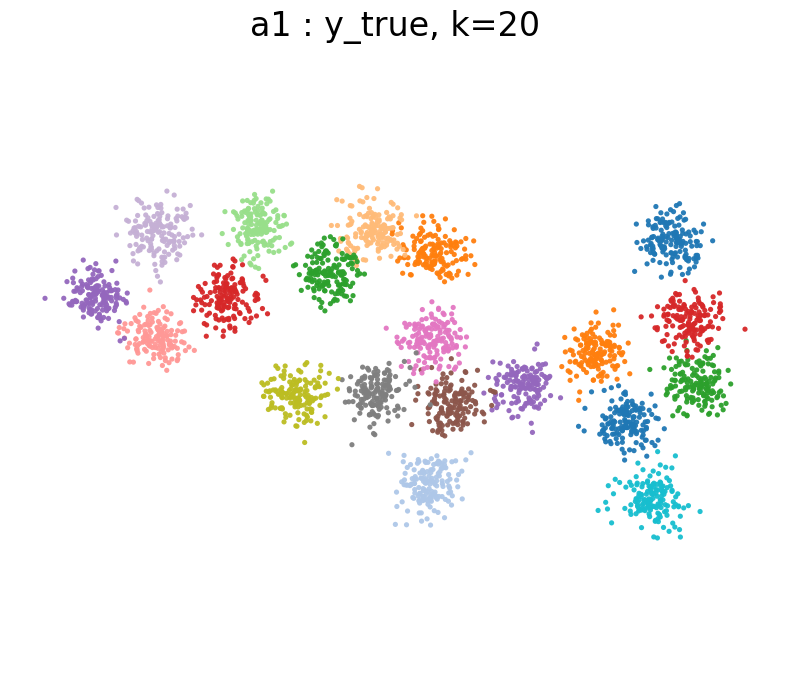

/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


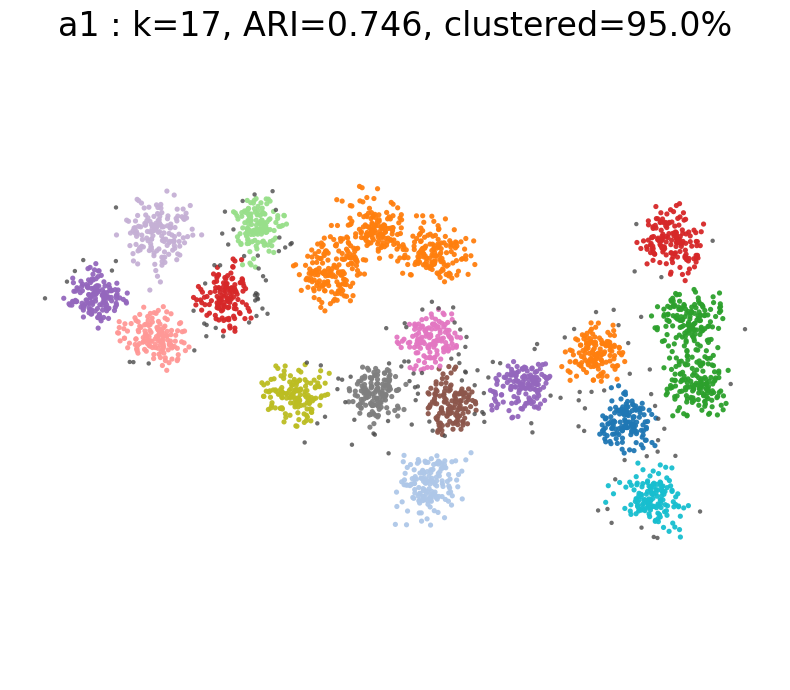

Calcul de la triangulation de Delaunay.
α-complexe calculé.
Simplex-Tree calculé. 17967  simplexes.
Skeleton de dimension K=2 calculé
5984  triangles étaient présents dans le Skeleton.
5178  triangles de Gabriel.
Avec les triangles obtus qui restaient, on a maintenant :
8402  triangles de Gabriel pour  23240  simplexes (points + arêtes + triangles).
3000
Skeleton de dimension K= 2  calculé
Complexe aux  8402 K-simplexes (arêtes du graphe) et aux  11838 K-1 simplexes (servant de nœuds). Faisant un total de  16804  arêtes (comptées avec multiplicité.
Matrice des distances calculées.
4  composantes connexes.
Fait.
Seuls  3000  points apparaissent dans la plus grande composante connexe pour  11829  simplexes.
Nouveau complexe (connexe) aux  8402 K-simplexes (arêtes du graphe) et aux  11829 K-1 simplexes (servant de nœuds). Faisant un total de  16798  arêtes (comptées avec multiplicité.
Matrice des distances calculées.
1  composantes connexes.
(11829,) [0 0 0 ... 0 0 0]
11829
minimum_spanni

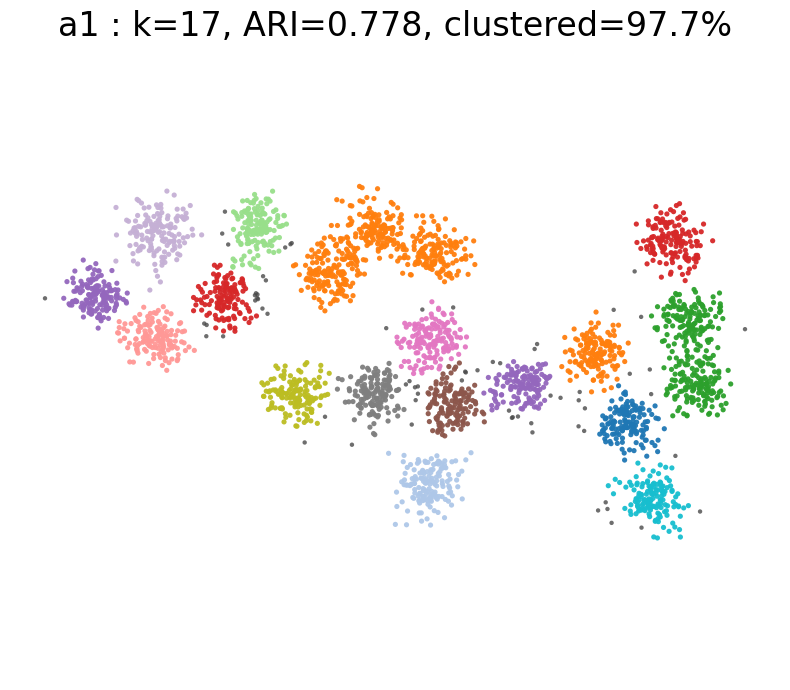



Processing: sipu a2
Source: I. Kärkkäinen, P. Fränti, Dynamic local search algorithm
for the clustering problem, Research Report A-2002-6.

Web: https://cs.joensuu.fi/sipu/datasets/

Synthetic 2D data with varying number of vectors and clusters.
There are 150 vectors per cluster.

`labels0` come from the Authors. `0` denotes the noise class (if present).

PercolThreshold = 72


/tmp/ipython-input-1358194788.py:24: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  tab10 = plt.cm.get_cmap("tab10").colors
/tmp/ipython-input-1358194788.py:25: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  tab20 = plt.cm.get_cmap("tab20").colors


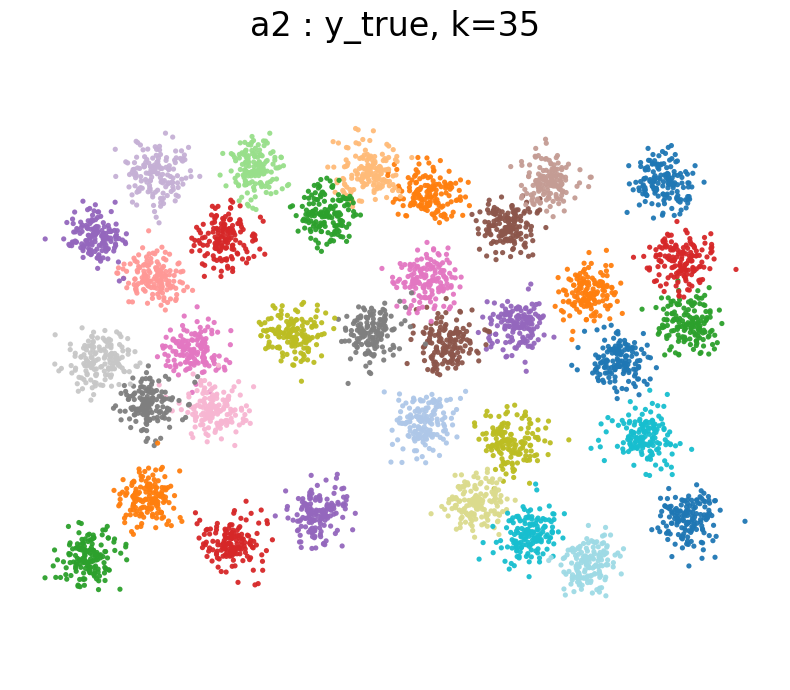

/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


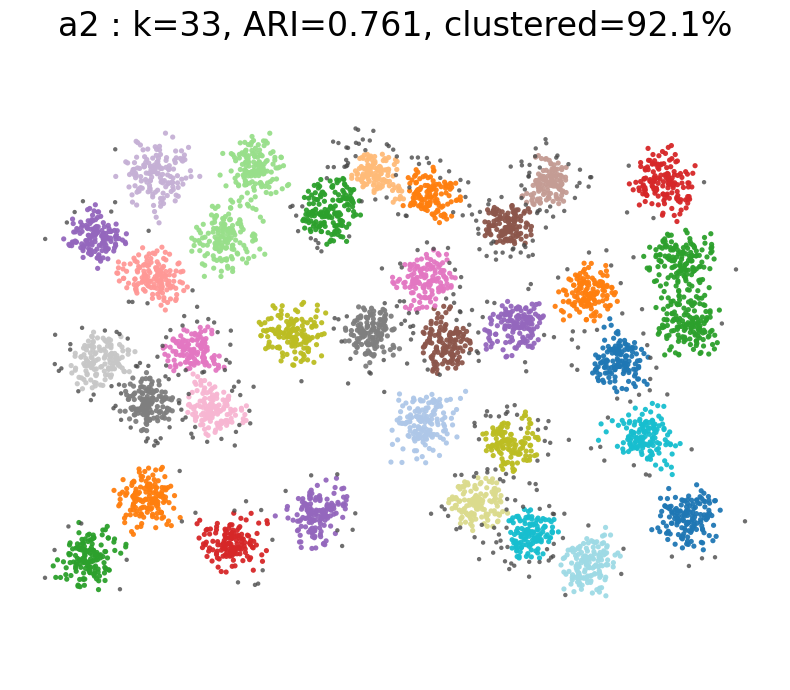

Calcul de la triangulation de Delaunay.
α-complexe calculé.
Simplex-Tree calculé. 31463  simplexes.
Skeleton de dimension K=2 calculé
10482  triangles étaient présents dans le Skeleton.
9115  triangles de Gabriel.
Avec les triangles obtus qui restaient, on a maintenant :
14755  triangles de Gabriel pour  40800  simplexes (points + arêtes + triangles).
5250
Skeleton de dimension K= 2  calculé
Complexe aux  14755 K-simplexes (arêtes du graphe) et aux  20795 K-1 simplexes (servant de nœuds). Faisant un total de  29510  arêtes (comptées avec multiplicité.
Matrice des distances calculées.
5  composantes connexes.
Fait.
Seuls  5250  points apparaissent dans la plus grande composante connexe pour  20781  simplexes.
Nouveau complexe (connexe) aux  14755 K-simplexes (arêtes du graphe) et aux  20781 K-1 simplexes (servant de nœuds). Faisant un total de  29500  arêtes (comptées avec multiplicité.
Matrice des distances calculées.
1  composantes connexes.
(20781,) [0 0 0 ... 0 0 0]
20781
minimum_sp

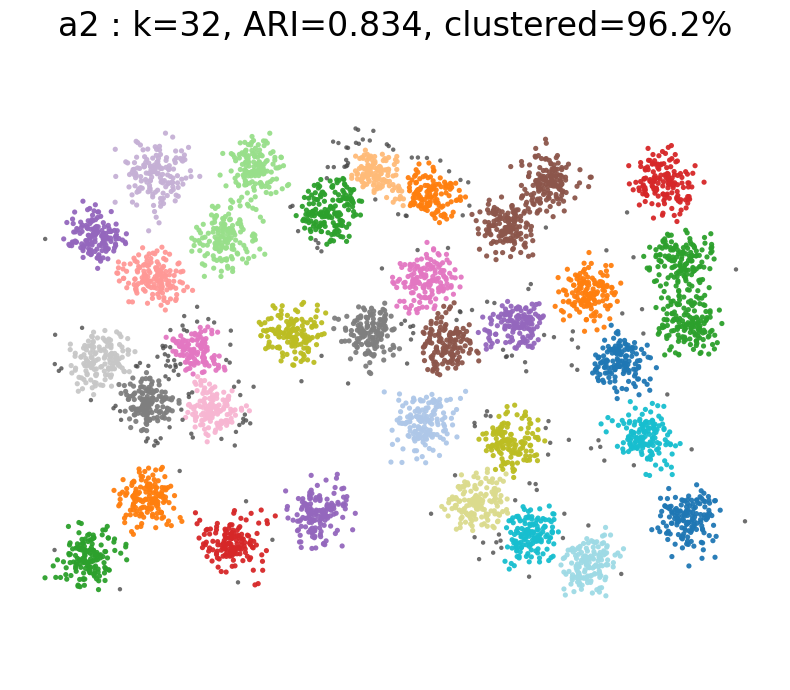



Processing: sipu a3
Source: I. Kärkkäinen, P. Fränti, Dynamic local search algorithm
for the clustering problem, Research Report A-2002-6.

Web: https://cs.joensuu.fi/sipu/datasets/

Synthetic 2D data with varying number of vectors and clusters.
There are 150 vectors per cluster.

`labels0` come from the Authors. `0` denotes the noise class (if present).

PercolThreshold = 87


/tmp/ipython-input-1358194788.py:24: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  tab10 = plt.cm.get_cmap("tab10").colors
/tmp/ipython-input-1358194788.py:25: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  tab20 = plt.cm.get_cmap("tab20").colors


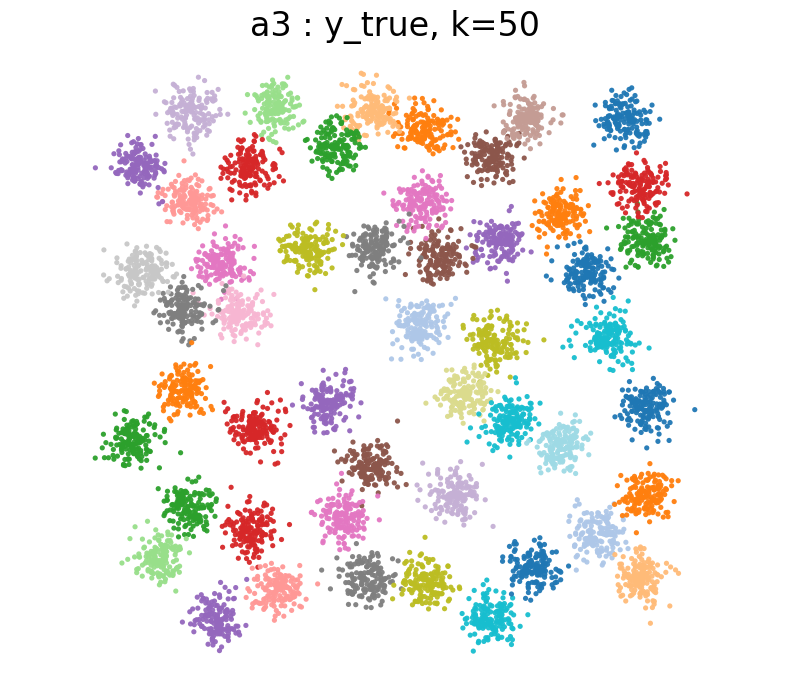

/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


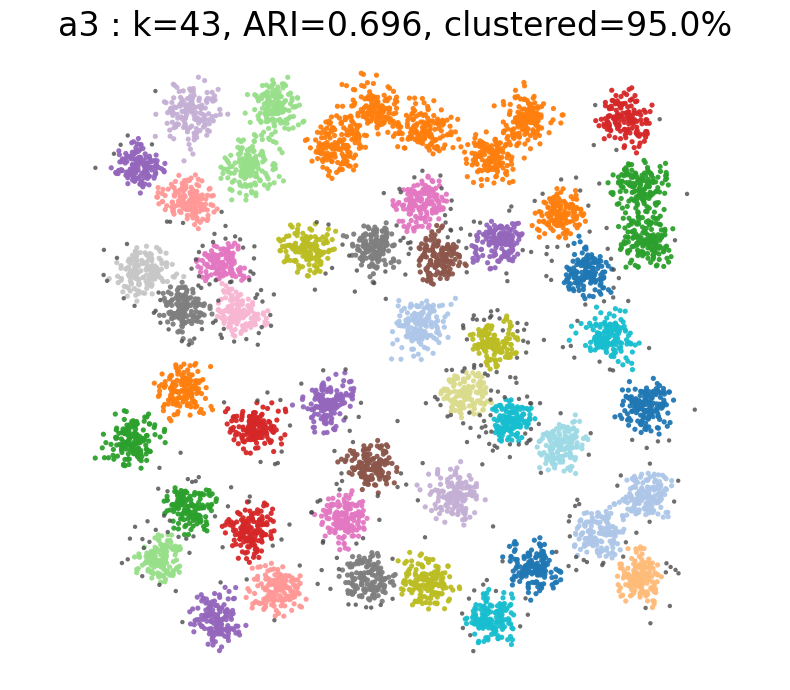

Calcul de la triangulation de Delaunay.
α-complexe calculé.
Simplex-Tree calculé. 44957  simplexes.
Skeleton de dimension K=2 calculé
14979  triangles étaient présents dans le Skeleton.
13010  triangles de Gabriel.
Avec les triangles obtus qui restaient, on a maintenant :
21017  triangles de Gabriel pour  58192  simplexes (points + arêtes + triangles).
7500
Skeleton de dimension K= 2  calculé
Complexe aux  21017 K-simplexes (arêtes du graphe) et aux  29675 K-1 simplexes (servant de nœuds). Faisant un total de  42034  arêtes (comptées avec multiplicité.
Matrice des distances calculées.
10  composantes connexes.
Fait.
Seuls  7500  points apparaissent dans la plus grande composante connexe pour  29646  simplexes.
Nouveau complexe (connexe) aux  21017 K-simplexes (arêtes du graphe) et aux  29646 K-1 simplexes (servant de nœuds). Faisant un total de  42014  arêtes (comptées avec multiplicité.
Matrice des distances calculées.
1  composantes connexes.
(29646,) [0 0 0 ... 0 0 0]
29646
minimum_

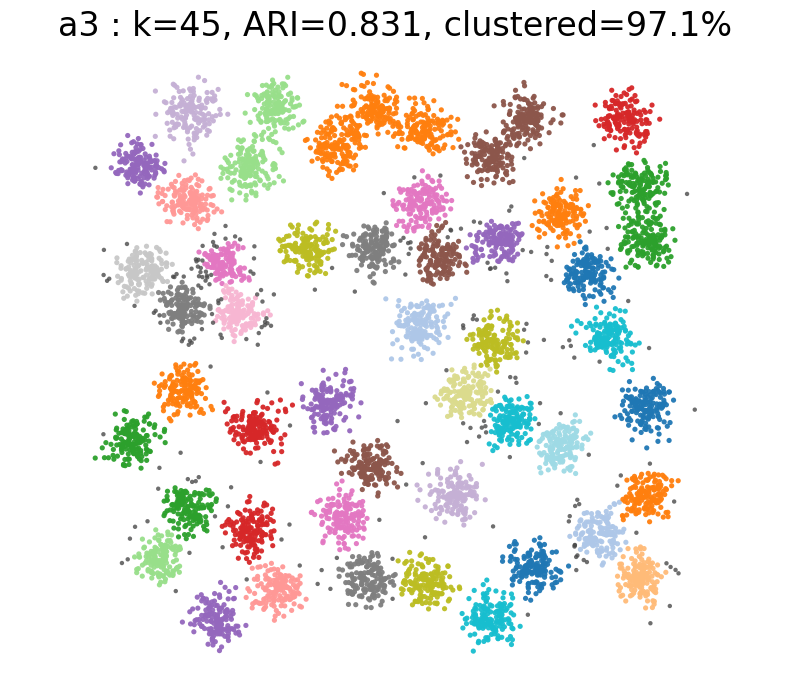



Processing: sipu aggregation
Source: A. Gionis, H. Mannila, P. Tsaparas, Clustering aggregation,
ACM Transactions on Knowledge Discovery from Data (TKDD), 2007, pp. 1-30.

Web: https://cs.joensuu.fi/sipu/datasets/

`labels0` come from the Authors.
`0` denotes the noise class (if present).

PercolThreshold = 28


/tmp/ipython-input-1358194788.py:24: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  tab10 = plt.cm.get_cmap("tab10").colors
/tmp/ipython-input-1358194788.py:25: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  tab20 = plt.cm.get_cmap("tab20").colors


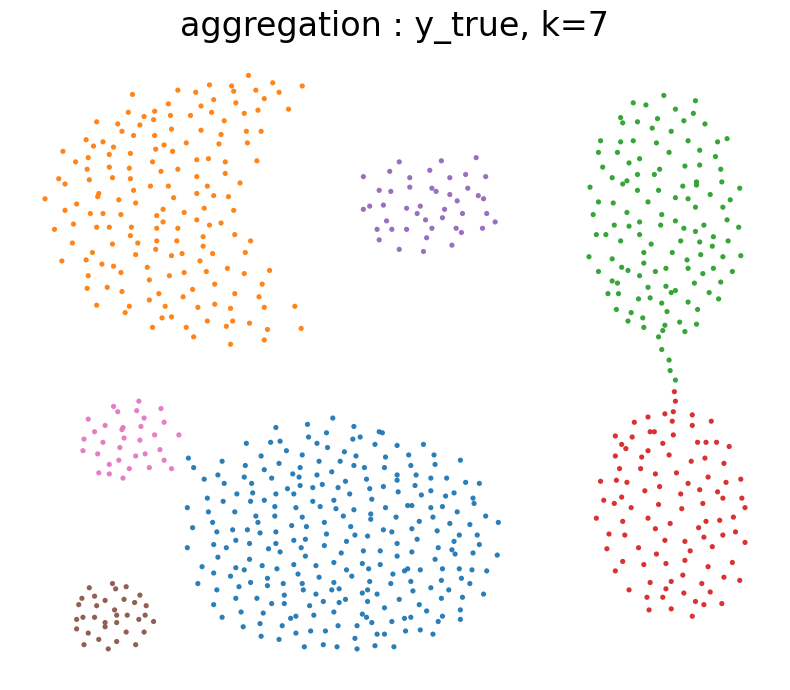

/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


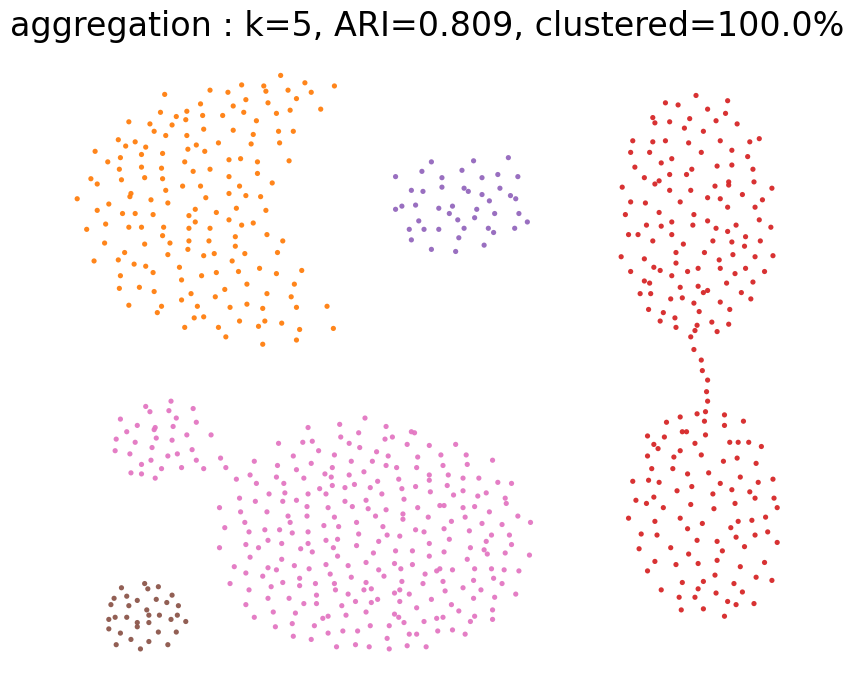

Calcul de la triangulation de Delaunay.
α-complexe calculé.
Simplex-Tree calculé. 4685  simplexes.
Skeleton de dimension K=2 calculé
1555  triangles étaient présents dans le Skeleton.
1423  triangles de Gabriel.
Avec les triangles obtus qui restaient, on a maintenant :
2305  triangles de Gabriel pour  6213  simplexes (points + arêtes + triangles).
788
Skeleton de dimension K= 2  calculé
Complexe aux  2305 K-simplexes (arêtes du graphe) et aux  3120 K-1 simplexes (servant de nœuds). Faisant un total de  4610  arêtes (comptées avec multiplicité.
Matrice des distances calculées.
3  composantes connexes.
Fait.
Seuls  788  points apparaissent dans la plus grande composante connexe pour  3114  simplexes.
Nouveau complexe (connexe) aux  2305 K-simplexes (arêtes du graphe) et aux  3114 K-1 simplexes (servant de nœuds). Faisant un total de  4606  arêtes (comptées avec multiplicité.
Matrice des distances calculées.
1  composantes connexes.
(3114,) [0 0 0 ... 0 0 0]
3114
minimum_spanning_tree
(31

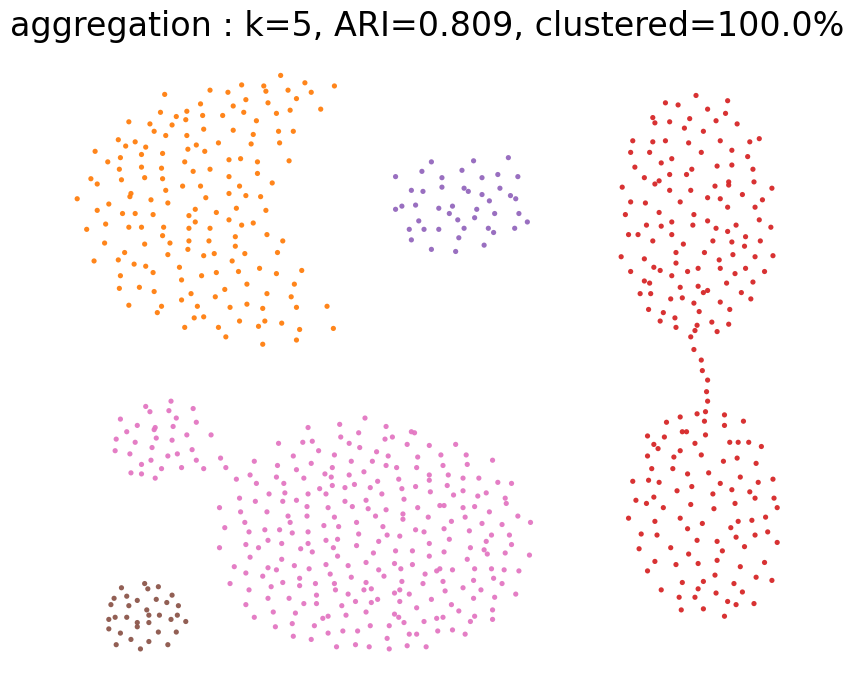



Processing: sipu birch1
Source: Zhang et al., BIRCH: A new data clustering algorithm and its applications,
Data Mining and Knowledge Discovery, 1 (2), 141-182, 1997.

Web: https://cs.joensuu.fi/sipu/datasets/

`labels0` come from the Authors. `0` denotes the noise class (if present).

PercolThreshold = 316


/tmp/ipython-input-1358194788.py:24: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  tab10 = plt.cm.get_cmap("tab10").colors
/tmp/ipython-input-1358194788.py:25: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  tab20 = plt.cm.get_cmap("tab20").colors


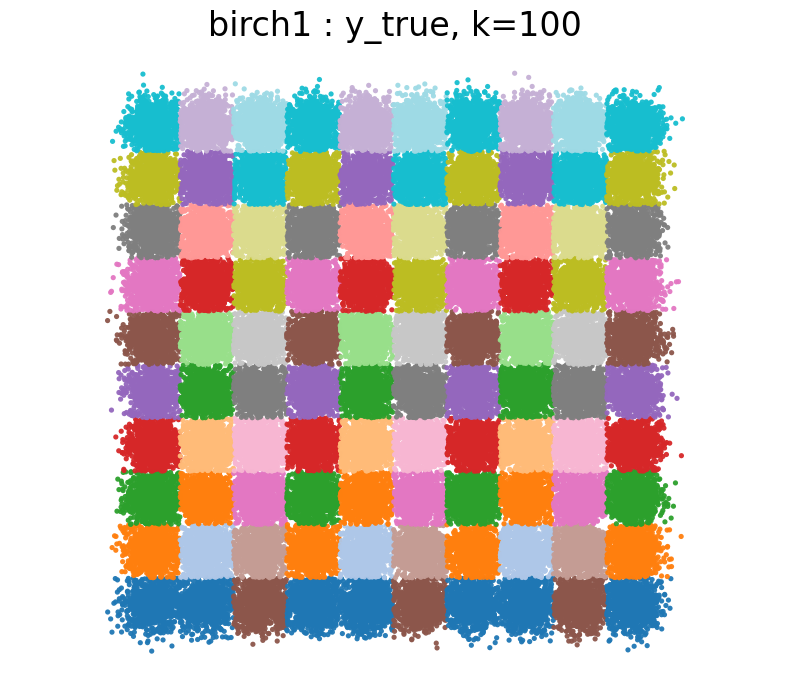

/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


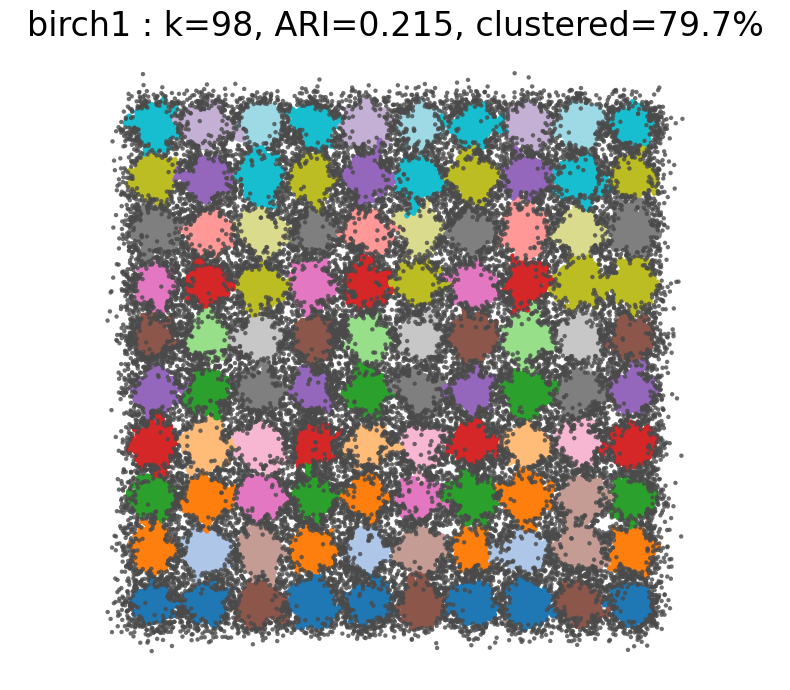

Calcul de la triangulation de Delaunay.
α-complexe calculé.
Simplex-Tree calculé. 599963  simplexes.
Skeleton de dimension K=2 calculé
199982  triangles étaient présents dans le Skeleton.
181192  triangles de Gabriel.
Avec les triangles obtus qui restaient, on a maintenant :
298084  triangles de Gabriel pour  810549  simplexes (points + arêtes + triangles).
100000
Skeleton de dimension K= 2  calculé
Complexe aux  298084 K-simplexes (arêtes du graphe) et aux  412465 K-1 simplexes (servant de nœuds). Faisant un total de  596168  arêtes (comptées avec multiplicité.
Matrice des distances calculées.
46  composantes connexes.
Fait.
Seuls  100000  points apparaissent dans la plus grande composante connexe pour  412318  simplexes.
Nouveau complexe (connexe) aux  298084 K-simplexes (arêtes du graphe) et aux  412318 K-1 simplexes (servant de nœuds). Faisant un total de  596066  arêtes (comptées avec multiplicité.
Matrice des distances calculées.
1  composantes connexes.
(412318,) [0 0 0 ... 0 0 

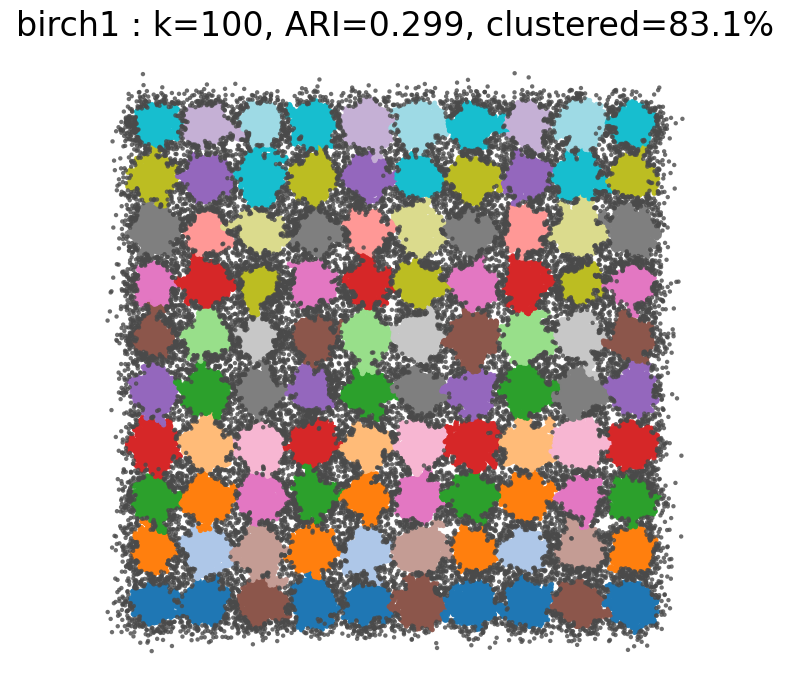



Processing: sipu birch2
Source: Zhang et al., BIRCH: A new data clustering algorithm and its applications,
Data Mining and Knowledge Discovery, 1 (2), 141-182, 1997.

Web: https://cs.joensuu.fi/sipu/datasets/

`labels0` come from the Authors. `0` denotes the noise class (if present).

PercolThreshold = 316


/tmp/ipython-input-1358194788.py:24: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  tab10 = plt.cm.get_cmap("tab10").colors
/tmp/ipython-input-1358194788.py:25: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  tab20 = plt.cm.get_cmap("tab20").colors


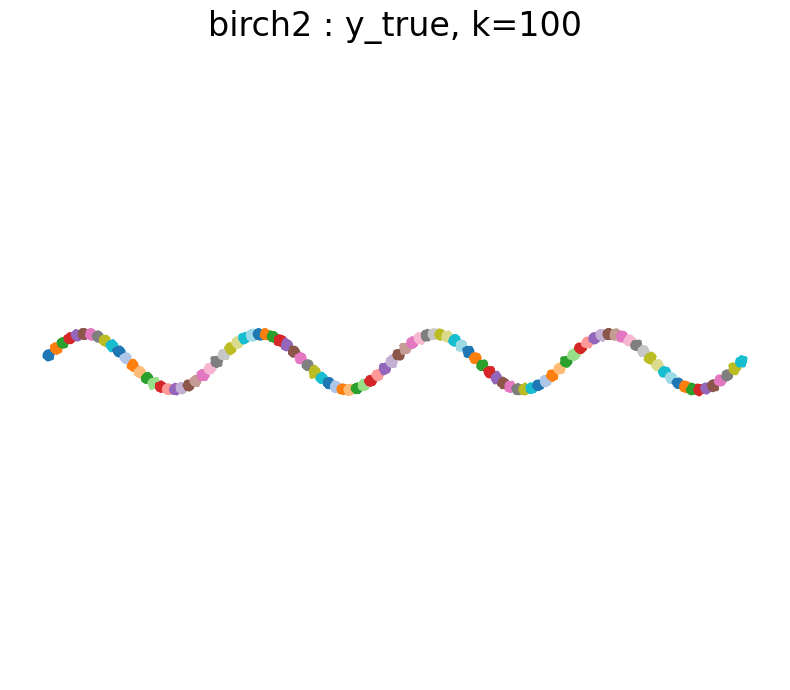

/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


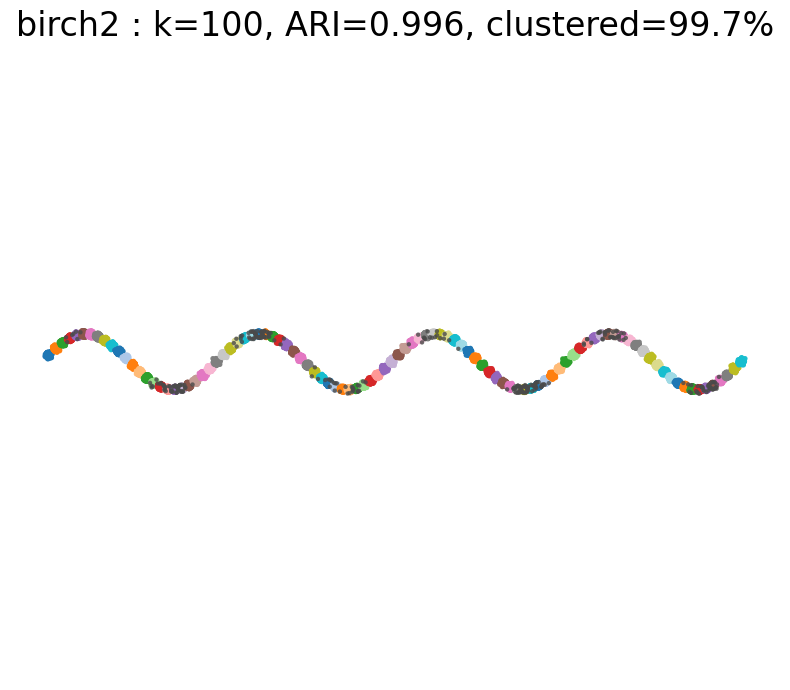

Calcul de la triangulation de Delaunay.
α-complexe calculé.
Simplex-Tree calculé. 599941  simplexes.
Skeleton de dimension K=2 calculé
199971  triangles étaient présents dans le Skeleton.
177940  triangles de Gabriel.
Avec les triangles obtus qui restaient, on a maintenant :
291510  triangles de Gabriel pour  797617  simplexes (points + arêtes + triangles).
100000
Skeleton de dimension K= 2  calculé
Complexe aux  291510 K-simplexes (arêtes du graphe) et aux  406107 K-1 simplexes (servant de nœuds). Faisant un total de  583020  arêtes (comptées avec multiplicité.
Matrice des distances calculées.
66  composantes connexes.
Fait.
Seuls  84005  points apparaissent dans la plus grande composante connexe pour  340929  simplexes.
Nouveau complexe (connexe) aux  291510 K-simplexes (arêtes du graphe) et aux  340929 K-1 simplexes (servant de nœuds). Faisant un total de  489452  arêtes (comptées avec multiplicité.
Matrice des distances calculées.
1  composantes connexes.
(340929,) [0 0 0 ... 0 0 0

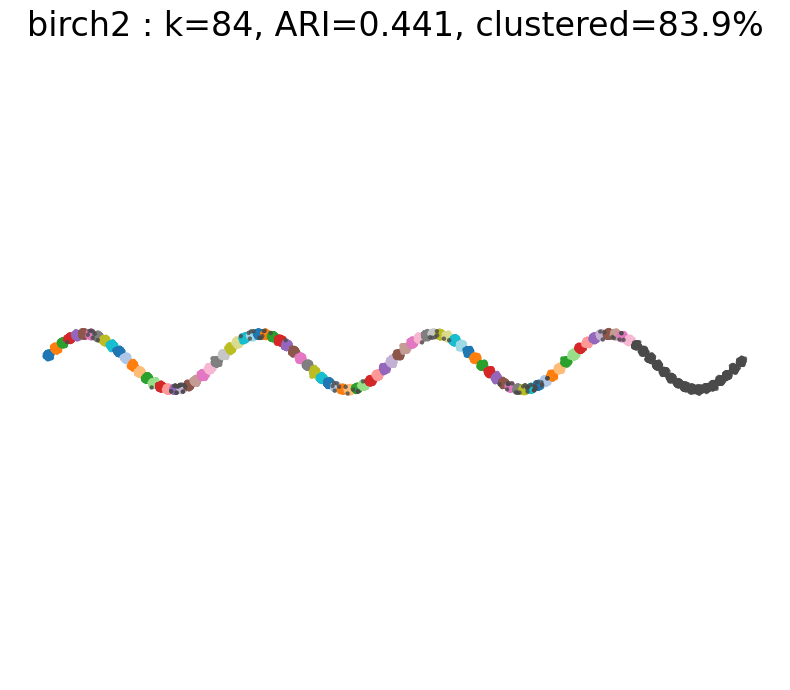



Processing: sipu compound
Source: C.T. Zahn, Graph-theoretical methods for detecting and describing
gestalt clusters, IEEE Transactions on Computers C-20(1), 1971, pp. 68-86.

Web: https://cs.joensuu.fi/sipu/datasets/

`labels0` come from the Authors.
`labels1`--`labels4` generated by A. Cena and M. Gagolewski.
`0` denotes the noise class (if present).



Processing: sipu d31
Source: C.J. Veenman, M.J.T. Reinders, E. Backer, A maximum variance cluster
algorithm, IEEE Transactions on Pattern Analysis and Machine Intelligence 24(9),
2002, pp. 1273-1280.

Web: https://cs.joensuu.fi/sipu/datasets/

`labels0` come from the Authors.

PercolThreshold = 56


/tmp/ipython-input-1358194788.py:24: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  tab10 = plt.cm.get_cmap("tab10").colors
/tmp/ipython-input-1358194788.py:25: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  tab20 = plt.cm.get_cmap("tab20").colors


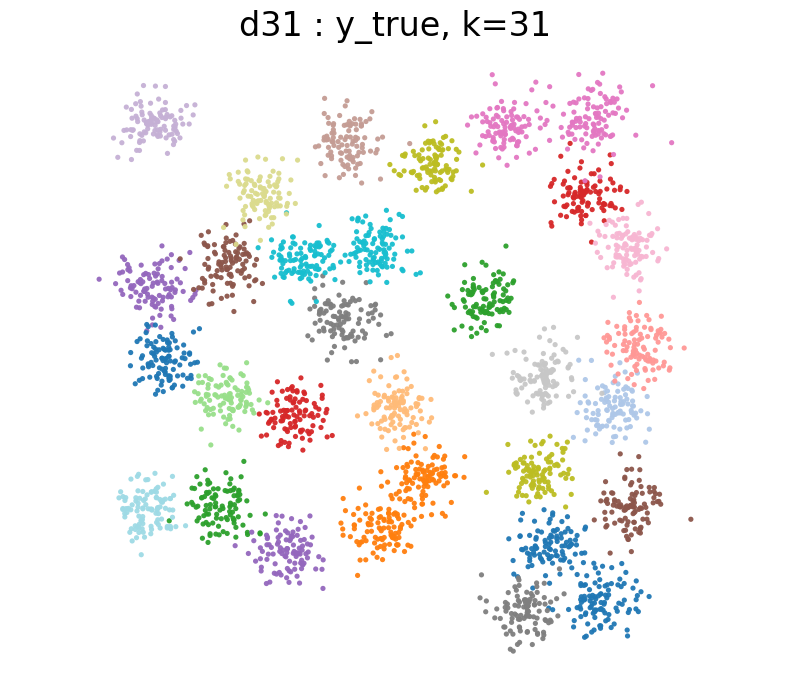

/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


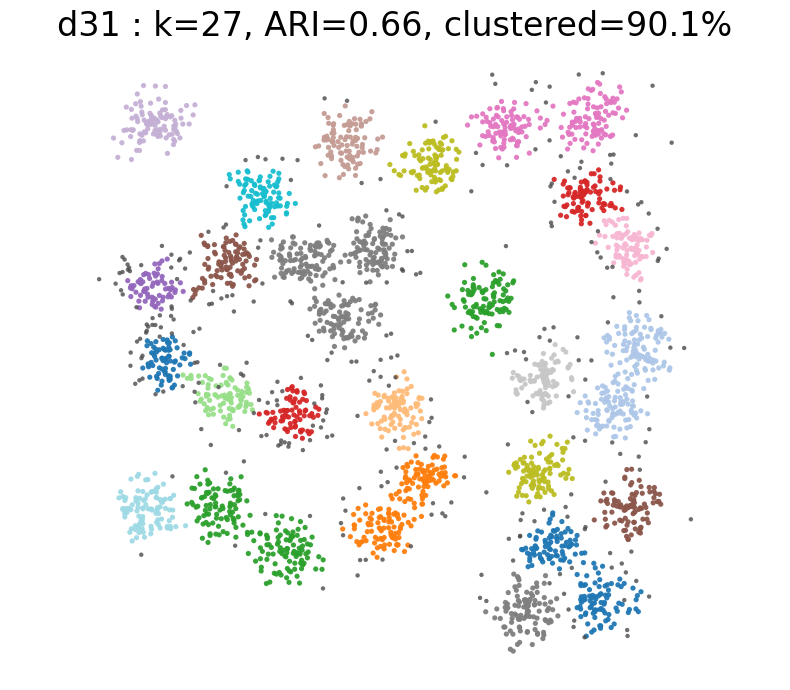

Calcul de la triangulation de Delaunay.
α-complexe calculé.
Simplex-Tree calculé. 18563  simplexes.
Skeleton de dimension K=2 calculé
6182  triangles étaient présents dans le Skeleton.
5271  triangles de Gabriel.
Avec les triangles obtus qui restaient, on a maintenant :
8536  triangles de Gabriel pour  23761  simplexes (points + arêtes + triangles).
3100
Skeleton de dimension K= 2  calculé
Complexe aux  8536 K-simplexes (arêtes du graphe) et aux  12125 K-1 simplexes (servant de nœuds). Faisant un total de  17072  arêtes (comptées avec multiplicité.
Matrice des distances calculées.
2  composantes connexes.
Fait.
Seuls  3100  points apparaissent dans la plus grande composante connexe pour  12122  simplexes.
Nouveau complexe (connexe) aux  8536 K-simplexes (arêtes du graphe) et aux  12122 K-1 simplexes (servant de nœuds). Faisant un total de  17070  arêtes (comptées avec multiplicité.
Matrice des distances calculées.
1  composantes connexes.
(12122,) [0 0 0 ... 0 0 0]
12122
minimum_spanni

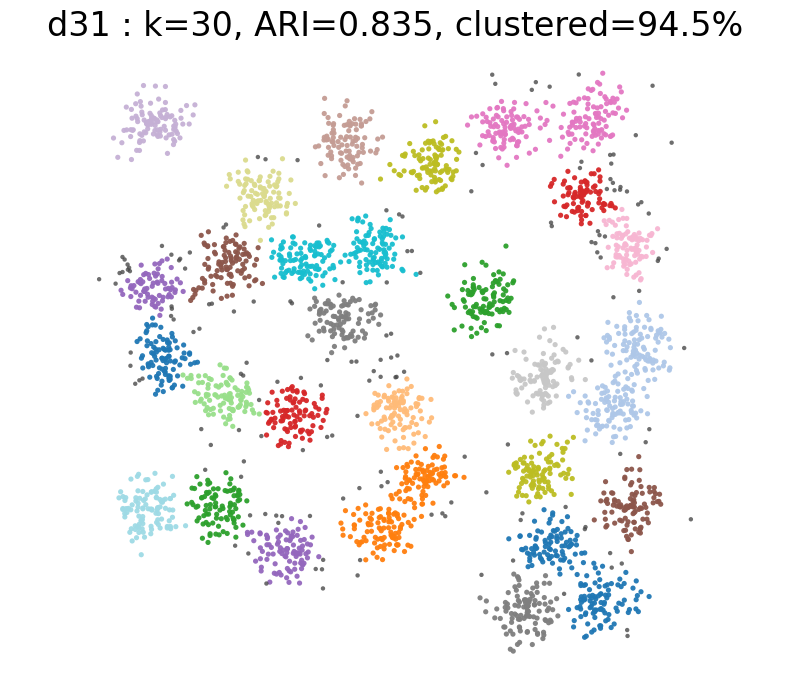



Processing: sipu flame
Source: L. Fu, E. Medico, FLAME, a novel fuzzy clustering method for
the analysis of DNA microarray data, BMC Bioinformatics 8, 2007, p. 3.

Web: https://cs.joensuu.fi/sipu/datasets/

`labels0` come from the Authors.
`labels1` generated by A. Cena and M. Gagolewski.
`0` denotes the noise class (if present).



Processing: sipu jain
Source: A. Jain, M. Law, Data clustering: A user’s dilemma,
Lecture Notes in Computer Science 3776, 2005, pp. 1-10.

Web: https://cs.joensuu.fi/sipu/datasets/

`labels0` come from the Authors. `0` denotes the noise class (if present).

PercolThreshold = 19


/tmp/ipython-input-1358194788.py:24: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  tab10 = plt.cm.get_cmap("tab10").colors
/tmp/ipython-input-1358194788.py:25: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  tab20 = plt.cm.get_cmap("tab20").colors


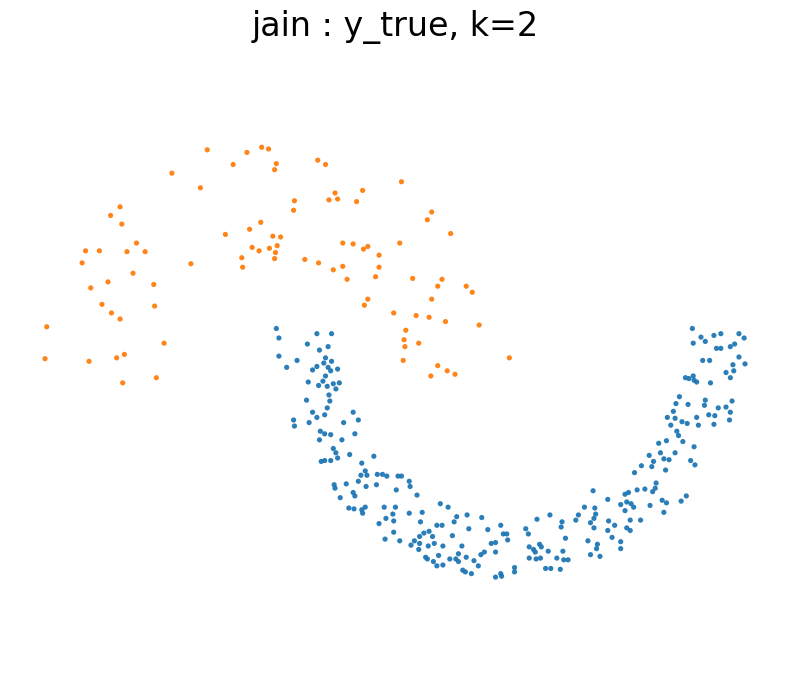

/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/tmp/ipython-input-1358194788.py:24: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  tab10 = plt.cm.get_cmap("tab10").colors
/tmp/ipython-input-1358194788.py:25: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  tab20 = plt.cm.get_cmap("tab20").colors


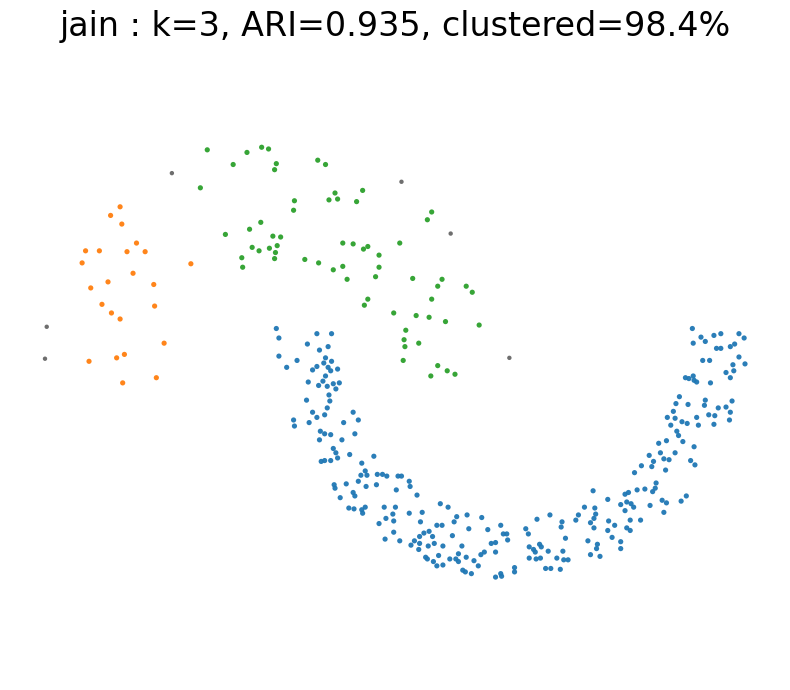

Calcul de la triangulation de Delaunay.
α-complexe calculé.
Simplex-Tree calculé. 2189  simplexes.
Skeleton de dimension K=2 calculé
722  triangles étaient présents dans le Skeleton.
582  triangles de Gabriel.
Avec les triangles obtus qui restaient, on a maintenant :
973  triangles de Gabriel pour  2736  simplexes (points + arêtes + triangles).
373
Skeleton de dimension K= 2  calculé
Complexe aux  973 K-simplexes (arêtes du graphe) et aux  1390 K-1 simplexes (servant de nœuds). Faisant un total de  1946  arêtes (comptées avec multiplicité.
Matrice des distances calculées.
2  composantes connexes.
Fait.
Seuls  373  points apparaissent dans la plus grande composante connexe pour  1387  simplexes.
Nouveau complexe (connexe) aux  973 K-simplexes (arêtes du graphe) et aux  1387 K-1 simplexes (servant de nœuds). Faisant un total de  1944  arêtes (comptées avec multiplicité.
Matrice des distances calculées.
1  composantes connexes.
(1387,) [0 0 0 ... 0 0 0]
1387
minimum_spanning_tree
(1386, 3

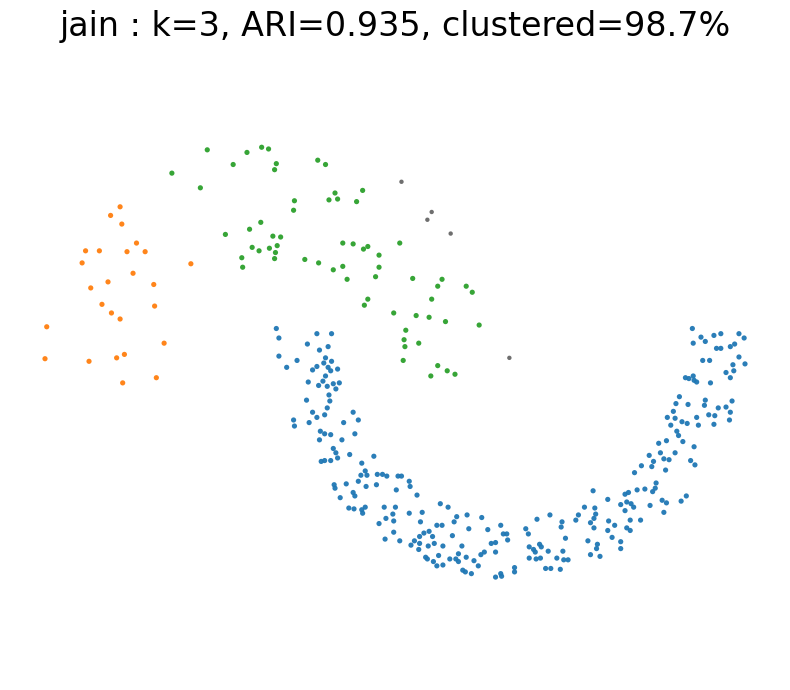



Processing: sipu pathbased
Source: H. Chang, D.Y. Yeung, Robust path-based spectral clustering,
Pattern Recognition 41(1), 2008, pp. 191-203.

Web: https://cs.joensuu.fi/sipu/datasets/

`labels0` come from the Authors.
`labels1` generated by M. Gagolewski.
`0` denotes the noise class (if present).



Processing: sipu r15
Source: C.J. Veenman, M.J.T. Reinders, E. Backer, A maximum variance cluster
algorithm, IEEE Transactions on Pattern Analysis and Machine Intelligence 24(9),
2002, pp. 1273-1280.

Web: https://cs.joensuu.fi/sipu/datasets/

`labels0` come from the Authors.
`labels1`, `labels2` generated by A. Cena and M. Gagolewski.
`0` denotes the noise class (if present).



Processing: sipu s1
Source: P. Fränti, O. Virmajoki,
Iterative shrinking method for clustering problems,
Pattern Recognition, 39(5), 2006, pp. 761-765.

Web: https://cs.joensuu.fi/sipu/datasets/

Synthetic 2D data with n=5000 vectors and K=15 Gaussian clusters with different
degree of cluster overlapping.

`labe

/tmp/ipython-input-1358194788.py:24: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  tab10 = plt.cm.get_cmap("tab10").colors
/tmp/ipython-input-1358194788.py:25: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  tab20 = plt.cm.get_cmap("tab20").colors


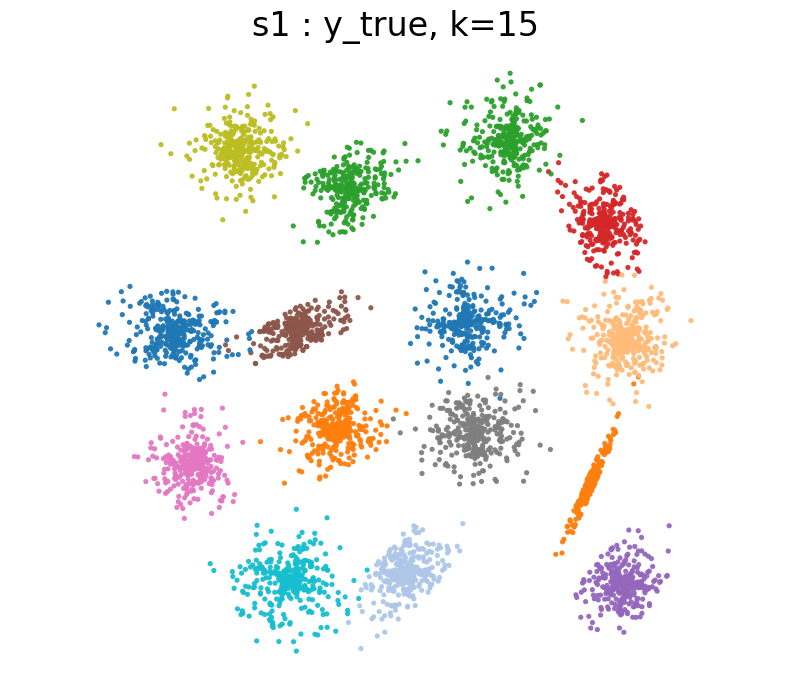

/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


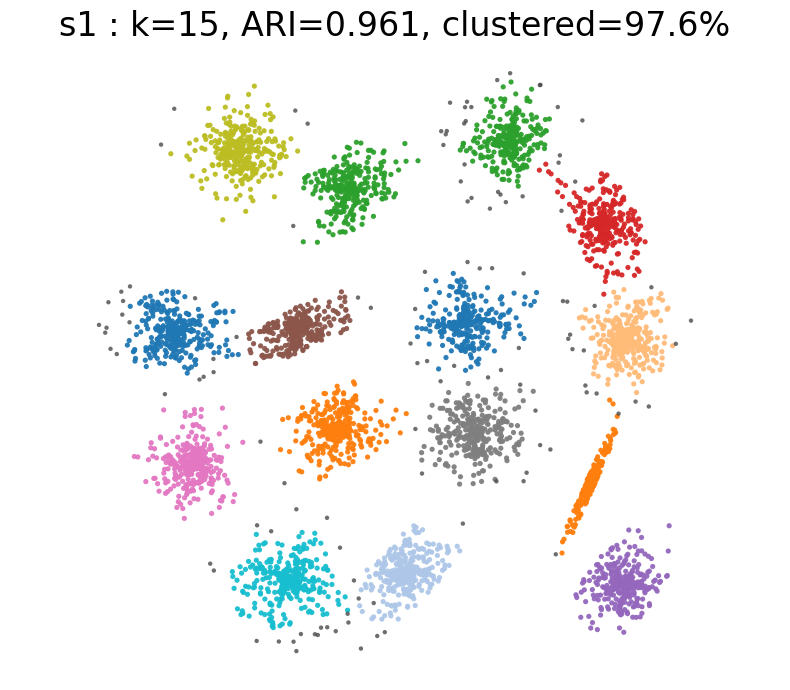

Calcul de la triangulation de Delaunay.
α-complexe calculé.
Simplex-Tree calculé. 29957  simplexes.
Skeleton de dimension K=2 calculé
9979  triangles étaient présents dans le Skeleton.
8571  triangles de Gabriel.
Avec les triangles obtus qui restaient, on a maintenant :
13997  triangles de Gabriel pour  38807  simplexes (points + arêtes + triangles).
5000
Skeleton de dimension K= 2  calculé
Complexe aux  13997 K-simplexes (arêtes du graphe) et aux  19810 K-1 simplexes (servant de nœuds). Faisant un total de  27994  arêtes (comptées avec multiplicité.
Matrice des distances calculées.
7  composantes connexes.
Fait.
Seuls  5000  points apparaissent dans la plus grande composante connexe pour  19792  simplexes.
Nouveau complexe (connexe) aux  13997 K-simplexes (arêtes du graphe) et aux  19792 K-1 simplexes (servant de nœuds). Faisant un total de  27982  arêtes (comptées avec multiplicité.
Matrice des distances calculées.
1  composantes connexes.
(19792,) [0 0 0 ... 0 0 0]
19792
minimum_spa

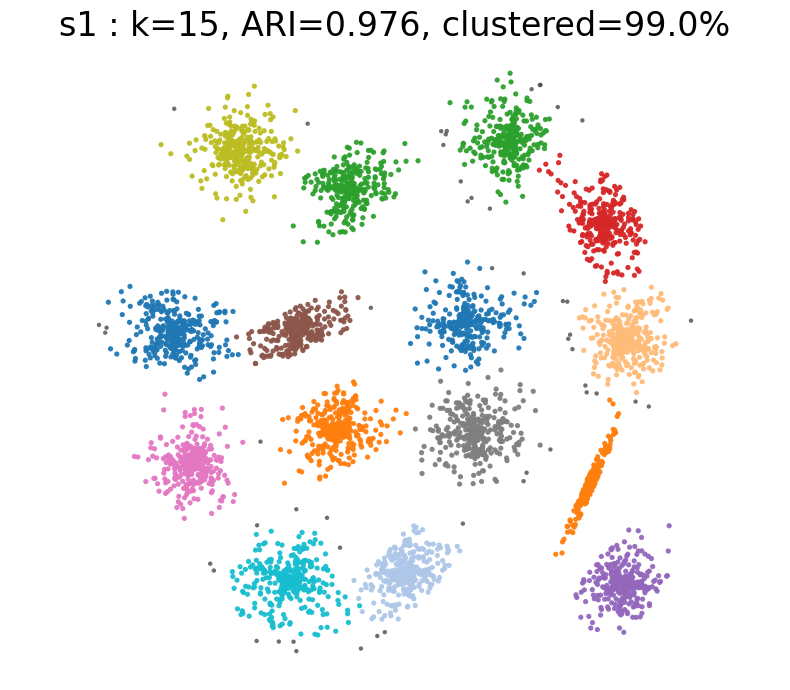



Processing: sipu s2
Source: P. Fränti, O. Virmajoki,
Iterative shrinking method for clustering problems,
Pattern Recognition, 39(5), 2006, pp. 761-765.

Web: https://cs.joensuu.fi/sipu/datasets/

Synthetic 2D data with n=5000 vectors and K=15 Gaussian clusters with different
degree of cluster overlapping.

`labels0` come from the Authors. `0` denotes the noise class (if present).

PercolThreshold = 71


/tmp/ipython-input-1358194788.py:24: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  tab10 = plt.cm.get_cmap("tab10").colors
/tmp/ipython-input-1358194788.py:25: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  tab20 = plt.cm.get_cmap("tab20").colors


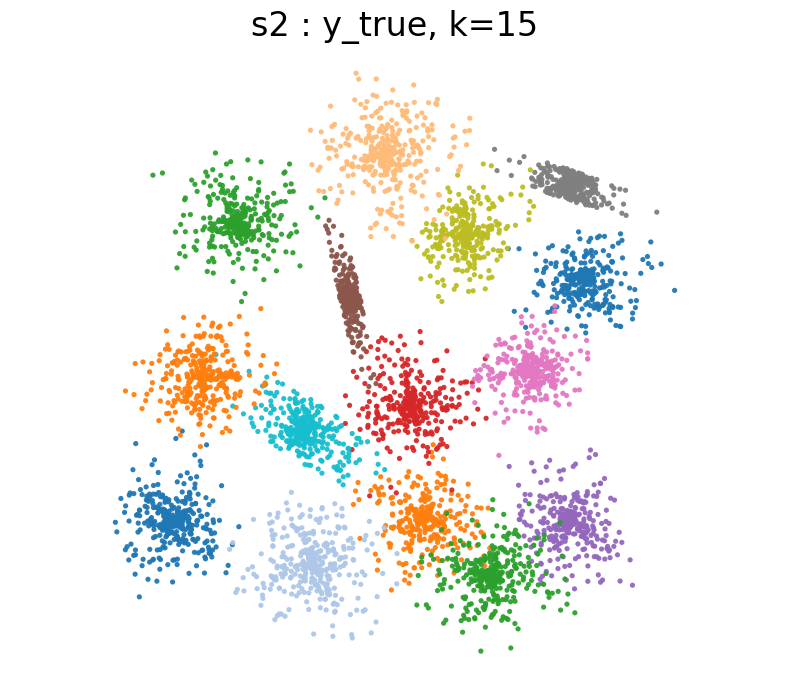

/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


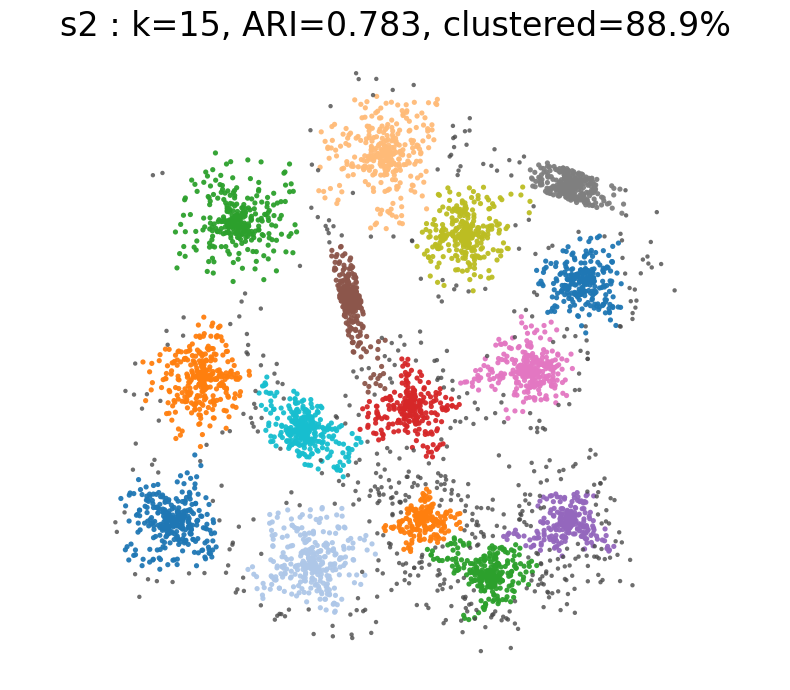

Calcul de la triangulation de Delaunay.
α-complexe calculé.
Simplex-Tree calculé. 29965  simplexes.
Skeleton de dimension K=2 calculé
9983  triangles étaient présents dans le Skeleton.
8726  triangles de Gabriel.
Avec les triangles obtus qui restaient, on a maintenant :
14144  triangles de Gabriel pour  39066  simplexes (points + arêtes + triangles).
5000
Skeleton de dimension K= 2  calculé
Complexe aux  14144 K-simplexes (arêtes du graphe) et aux  19922 K-1 simplexes (servant de nœuds). Faisant un total de  28288  arêtes (comptées avec multiplicité.
Matrice des distances calculées.
10  composantes connexes.
Fait.
Seuls  5000  points apparaissent dans la plus grande composante connexe pour  19895  simplexes.
Nouveau complexe (connexe) aux  14144 K-simplexes (arêtes du graphe) et aux  19895 K-1 simplexes (servant de nœuds). Faisant un total de  28270  arêtes (comptées avec multiplicité.
Matrice des distances calculées.
1  composantes connexes.
(19895,) [0 0 0 ... 0 0 0]
19895
minimum_sp

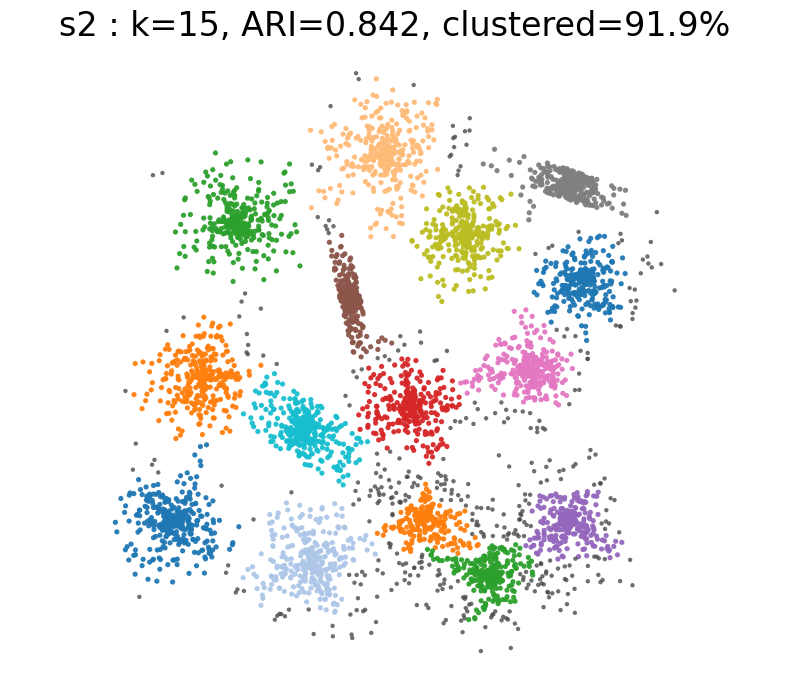



Processing: sipu s3
Source: P. Fränti, O. Virmajoki,
Iterative shrinking method for clustering problems,
Pattern Recognition, 39(5), 2006, pp. 761-765.

Web: https://cs.joensuu.fi/sipu/datasets/

Synthetic 2D data with n=5000 vectors and K=15 Gaussian clusters with different
degree of cluster overlapping.

`labels0` come from the Authors. `0` denotes the noise class (if present).

PercolThreshold = 71


/tmp/ipython-input-1358194788.py:24: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  tab10 = plt.cm.get_cmap("tab10").colors
/tmp/ipython-input-1358194788.py:25: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  tab20 = plt.cm.get_cmap("tab20").colors


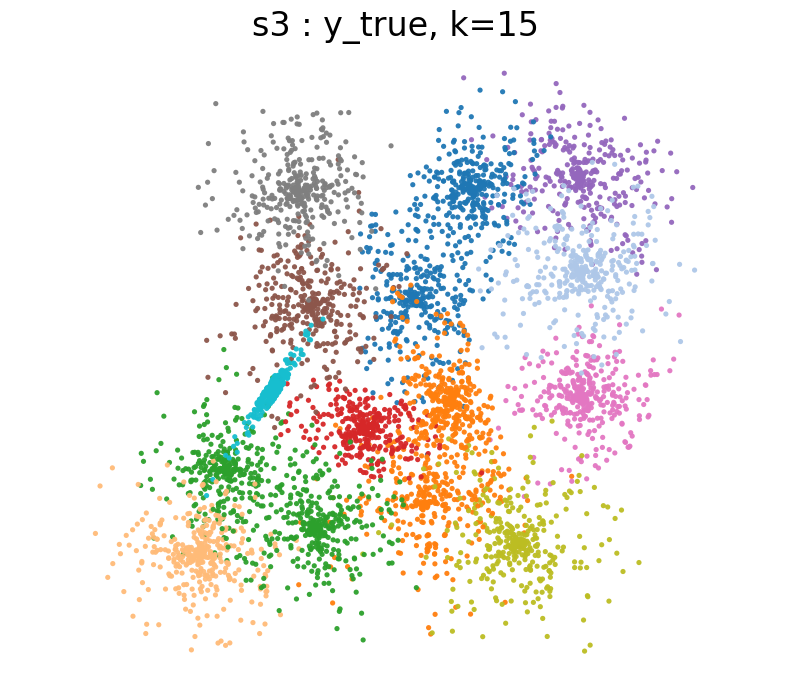

/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


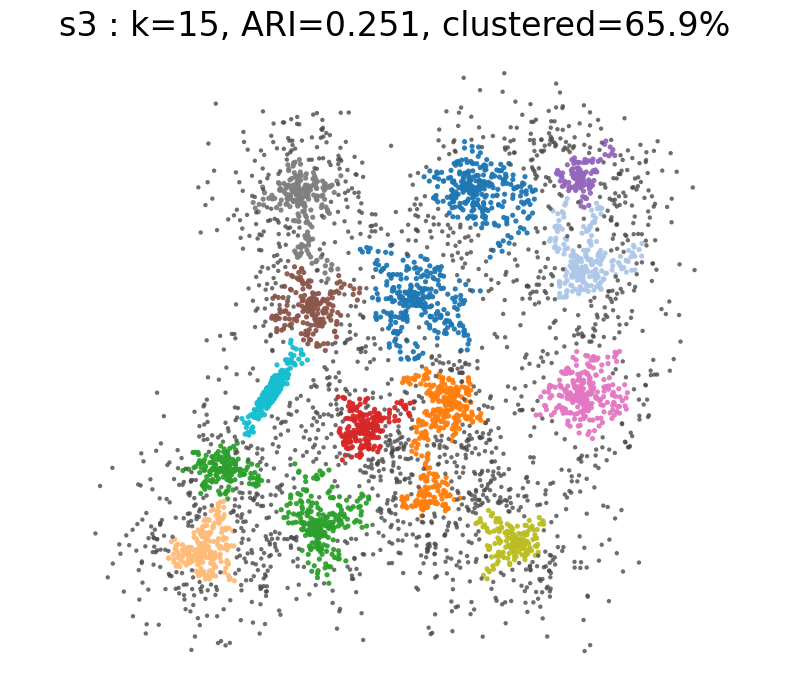

Calcul de la triangulation de Delaunay.
α-complexe calculé.
Simplex-Tree calculé. 29961  simplexes.
Skeleton de dimension K=2 calculé
9981  triangles étaient présents dans le Skeleton.
8808  triangles de Gabriel.
Avec les triangles obtus qui restaient, on a maintenant :
14370  triangles de Gabriel pour  39513  simplexes (points + arêtes + triangles).
5000
Skeleton de dimension K= 2  calculé
Complexe aux  14370 K-simplexes (arêtes du graphe) et aux  20143 K-1 simplexes (servant de nœuds). Faisant un total de  28740  arêtes (comptées avec multiplicité.
Matrice des distances calculées.
2  composantes connexes.
Fait.
Seuls  5000  points apparaissent dans la plus grande composante connexe pour  20140  simplexes.
Nouveau complexe (connexe) aux  14370 K-simplexes (arêtes du graphe) et aux  20140 K-1 simplexes (servant de nœuds). Faisant un total de  28738  arêtes (comptées avec multiplicité.
Matrice des distances calculées.
1  composantes connexes.
(20140,) [0 0 0 ... 0 0 0]
20140
minimum_spa

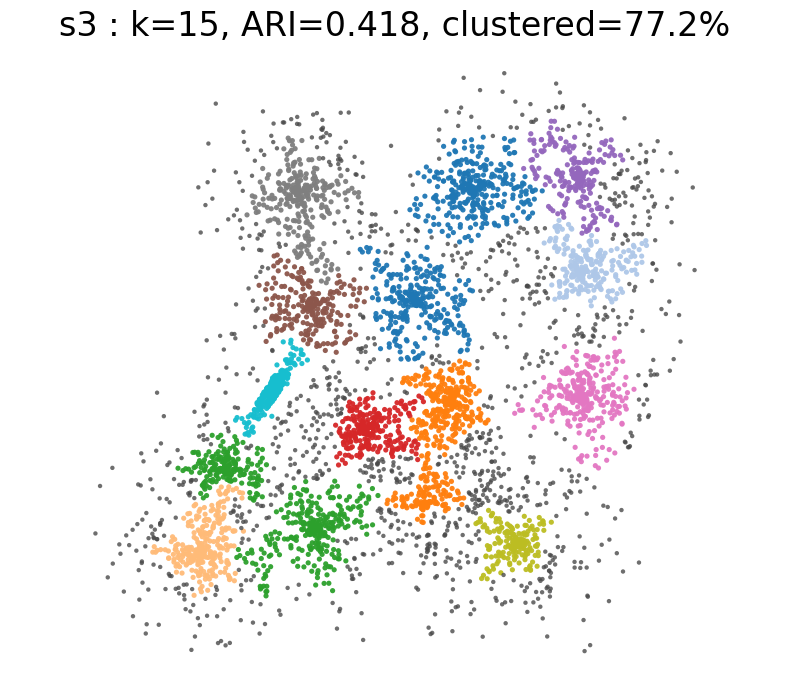



Processing: sipu s4
Source: P. Fränti, O. Virmajoki,
Iterative shrinking method for clustering problems,
Pattern Recognition, 39(5), 2006, pp. 761-765.

Web: https://cs.joensuu.fi/sipu/datasets/

Synthetic 2D data with n=5000 vectors and K=15 Gaussian clusters with different
degree of cluster overlapping.

`labels0` come from the Authors. `0` denotes the noise class (if present).

PercolThreshold = 71


/tmp/ipython-input-1358194788.py:24: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  tab10 = plt.cm.get_cmap("tab10").colors
/tmp/ipython-input-1358194788.py:25: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  tab20 = plt.cm.get_cmap("tab20").colors


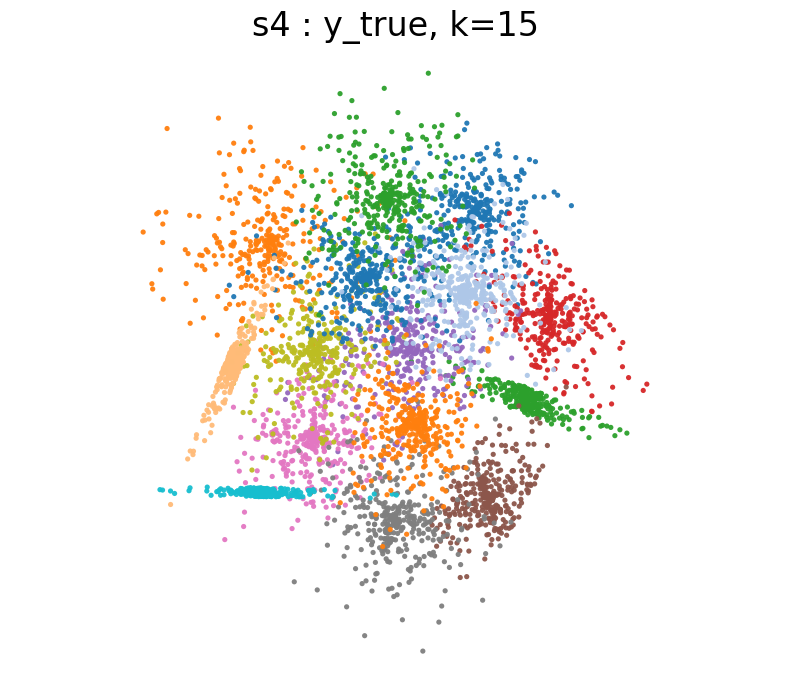

/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


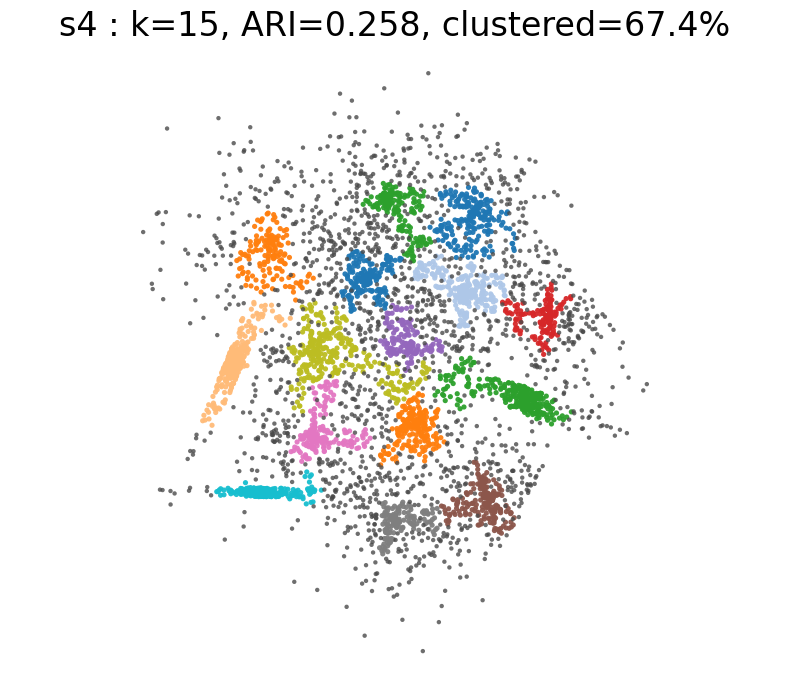

Calcul de la triangulation de Delaunay.
α-complexe calculé.
Simplex-Tree calculé. 29971  simplexes.
Skeleton de dimension K=2 calculé
9986  triangles étaient présents dans le Skeleton.
8842  triangles de Gabriel.
Avec les triangles obtus qui restaient, on a maintenant :
14345  triangles de Gabriel pour  39413  simplexes (points + arêtes + triangles).
5000
Skeleton de dimension K= 2  calculé
Complexe aux  14345 K-simplexes (arêtes du graphe) et aux  20068 K-1 simplexes (servant de nœuds). Faisant un total de  28690  arêtes (comptées avec multiplicité.
Matrice des distances calculées.
1  composantes connexes.
Fait.
Seuls  5000  points apparaissent dans la plus grande composante connexe pour  20068  simplexes.
Nouveau complexe (connexe) aux  14345 K-simplexes (arêtes du graphe) et aux  20068 K-1 simplexes (servant de nœuds). Faisant un total de  28690  arêtes (comptées avec multiplicité.
Matrice des distances calculées.
1  composantes connexes.
(20068,) [0 0 0 ... 0 0 0]
20068
minimum_spa

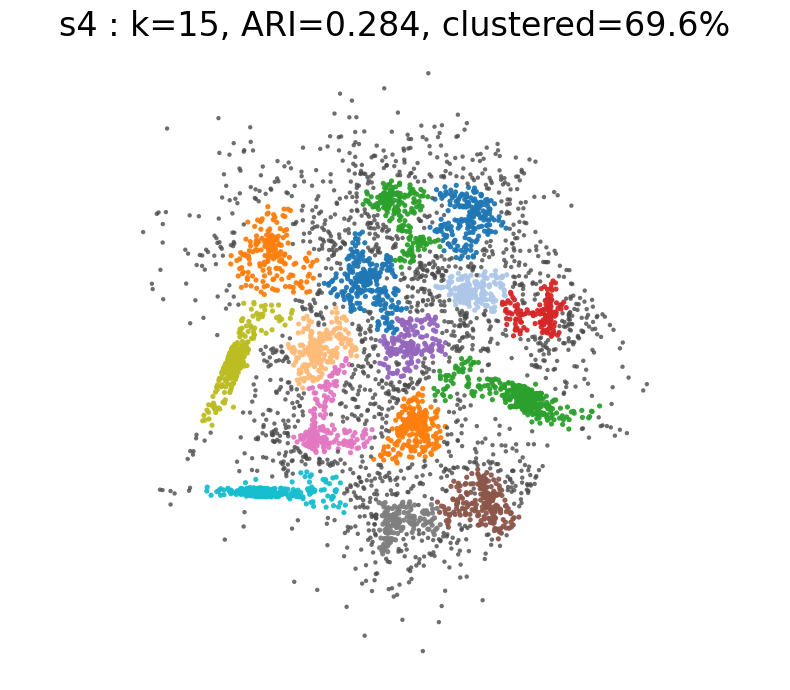



Processing: sipu spiral
Source: H. Chang, D.Y. Yeung, Robust path-based spectral clustering,
Pattern Recognition 41(1), 2008, pp. 191-203.

Web: https://cs.joensuu.fi/sipu/datasets/

`labels0` come from the Authors. `0` denotes the noise class (if present).

PercolThreshold = 18


/tmp/ipython-input-1358194788.py:24: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  tab10 = plt.cm.get_cmap("tab10").colors
/tmp/ipython-input-1358194788.py:25: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  tab20 = plt.cm.get_cmap("tab20").colors


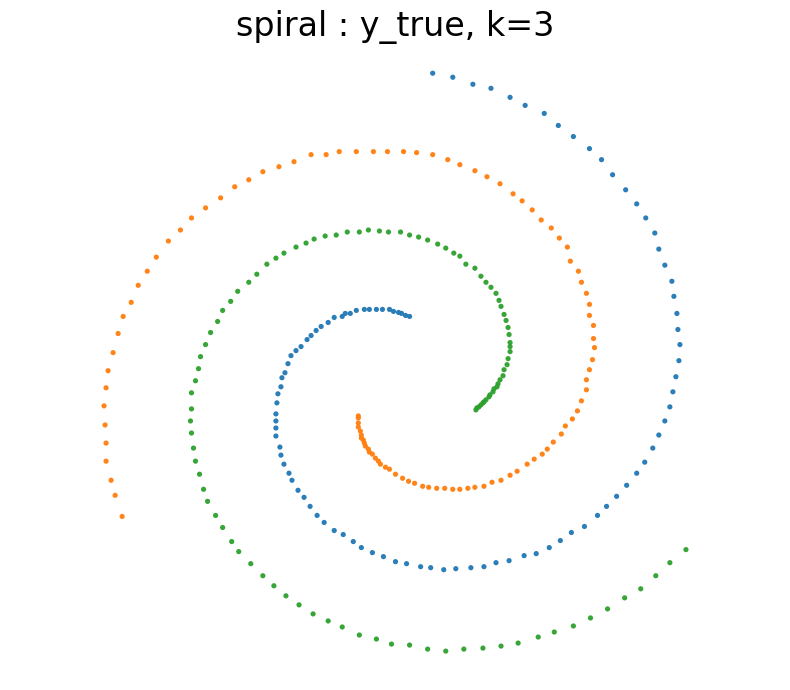

/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


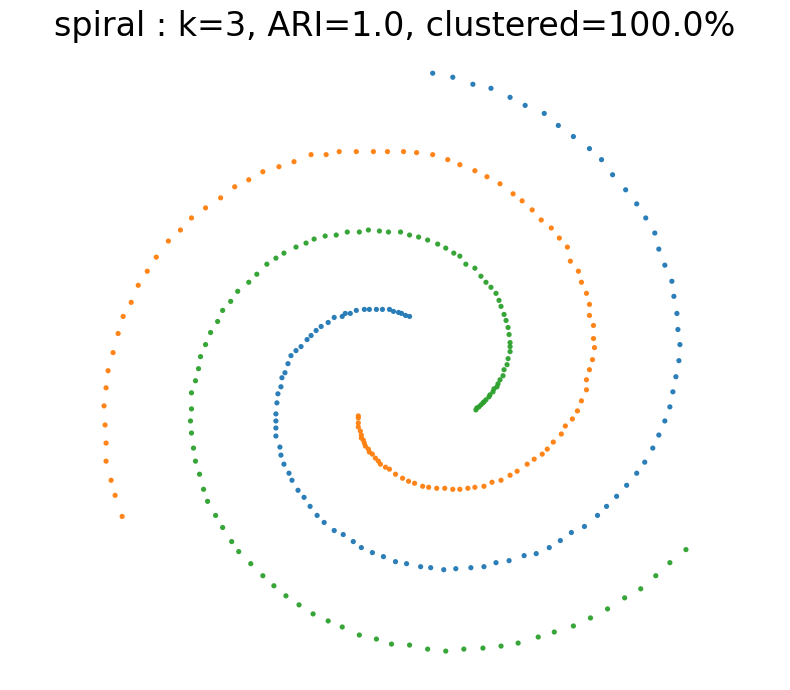

Calcul de la triangulation de Delaunay.
α-complexe calculé.
Simplex-Tree calculé. 1777  simplexes.
Skeleton de dimension K=2 calculé
577  triangles étaient présents dans le Skeleton.
474  triangles de Gabriel.
Avec les triangles obtus qui restaient, on a maintenant :
847  triangles de Gabriel pour  2339  simplexes (points + arêtes + triangles).
312
Skeleton de dimension K= 2  calculé
Complexe aux  847 K-simplexes (arêtes du graphe) et aux  1180 K-1 simplexes (servant de nœuds). Faisant un total de  1694  arêtes (comptées avec multiplicité.
Matrice des distances calculées.
2  composantes connexes.
Fait.
Seuls  312  points apparaissent dans la plus grande composante connexe pour  1177  simplexes.
Nouveau complexe (connexe) aux  847 K-simplexes (arêtes du graphe) et aux  1177 K-1 simplexes (servant de nœuds). Faisant un total de  1692  arêtes (comptées avec multiplicité.
Matrice des distances calculées.
1  composantes connexes.
(1177,) [0 0 0 ... 0 0 0]
1177
minimum_spanning_tree
(1176, 3

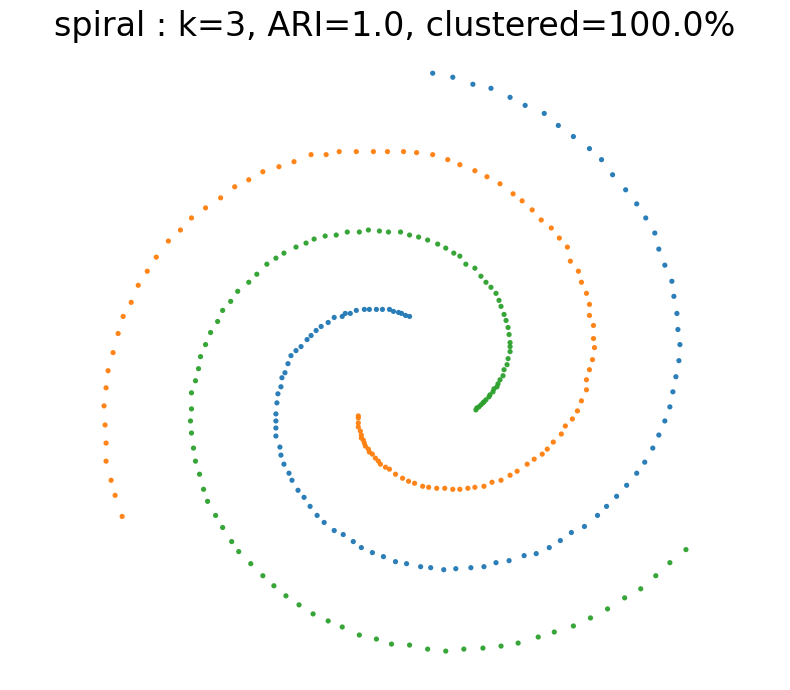



Processing: sipu unbalance
Source: M. Rezaei, P. Fränti, Set-matching methods for external cluster
validity, IEEE Trans. on Knowledge and Data Engineering, 28(8), pp. 2173-2186, 2016.

Web: https://cs.joensuu.fi/sipu/datasets/

`labels0` come from the Authors. `0` denotes the noise class (if present).

PercolThreshold = 81


/tmp/ipython-input-1358194788.py:24: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  tab10 = plt.cm.get_cmap("tab10").colors
/tmp/ipython-input-1358194788.py:25: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  tab20 = plt.cm.get_cmap("tab20").colors


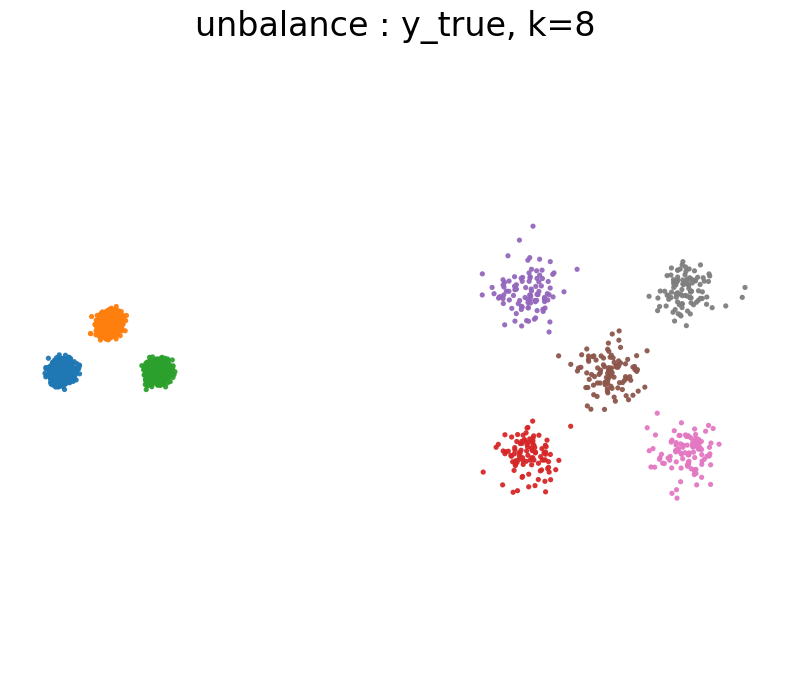

/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


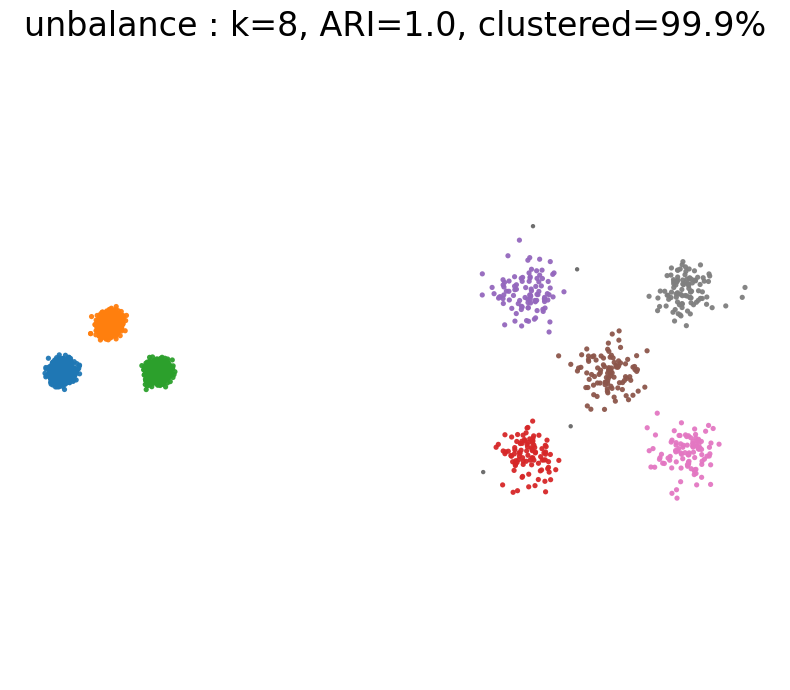

Calcul de la triangulation de Delaunay.
α-complexe calculé.
Simplex-Tree calculé. 38961  simplexes.
Skeleton de dimension K=2 calculé
12981  triangles étaient présents dans le Skeleton.
11548  triangles de Gabriel.
Avec les triangles obtus qui restaient, on a maintenant :
18890  triangles de Gabriel pour  51749  simplexes (points + arêtes + triangles).
6500
Skeleton de dimension K= 2  calculé
Complexe aux  18890 K-simplexes (arêtes du graphe) et aux  26359 K-1 simplexes (servant de nœuds). Faisant un total de  37780  arêtes (comptées avec multiplicité.
Matrice des distances calculées.
7  composantes connexes.
Fait.
Seuls  6500  points apparaissent dans la plus grande composante connexe pour  26341  simplexes.
Nouveau complexe (connexe) aux  18890 K-simplexes (arêtes du graphe) et aux  26341 K-1 simplexes (servant de nœuds). Faisant un total de  37768  arêtes (comptées avec multiplicité.
Matrice des distances calculées.
1  composantes connexes.
(26341,) [0 0 0 ... 0 0 0]
26341
minimum_s

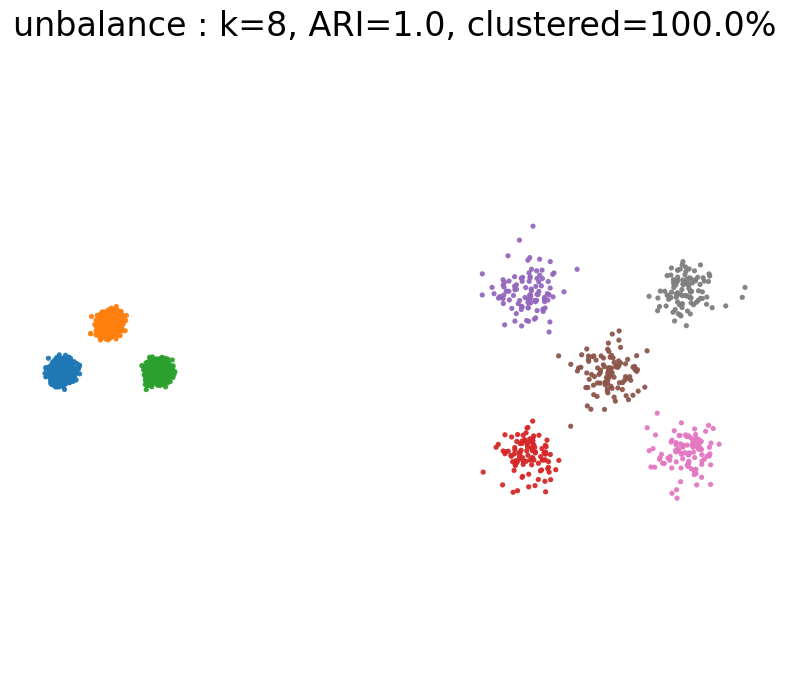



Processing: sipu worms_2
Synthetic 2D data with worm-like shapes

Source: S. Sieranoja and P. Fränti,
Fast and general density peaks clustering,
Pattern Recognition Letters, 128, 551-558, 2019.

Web: https://cs.joensuu.fi/sipu/datasets/

`labels0` come from the Authors.

PercolThreshold = 325


/tmp/ipython-input-1358194788.py:24: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  tab10 = plt.cm.get_cmap("tab10").colors
/tmp/ipython-input-1358194788.py:25: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  tab20 = plt.cm.get_cmap("tab20").colors


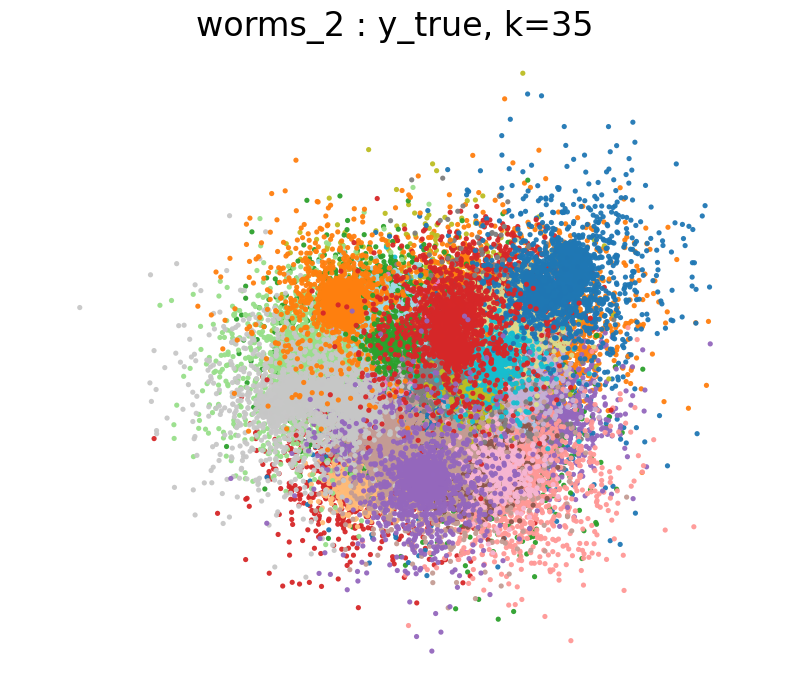

/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


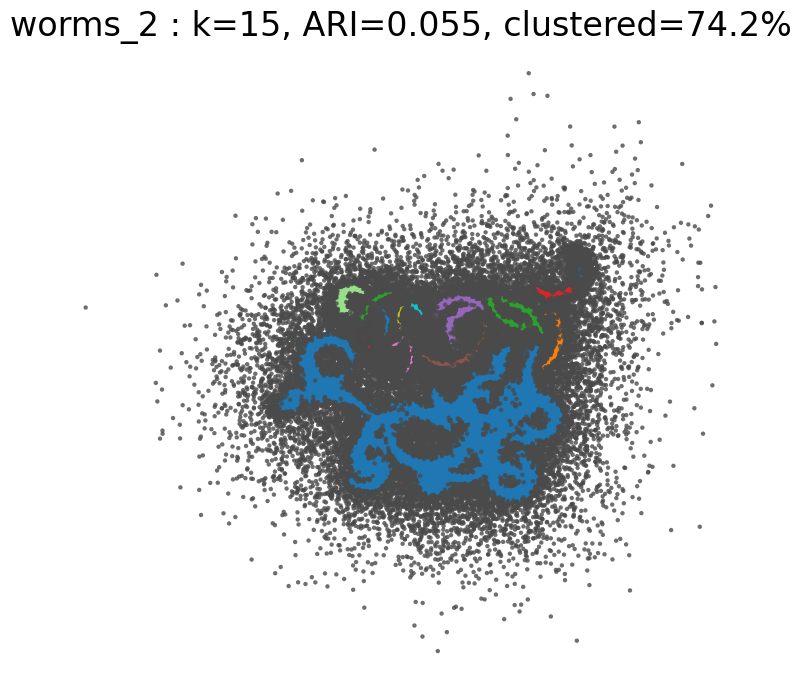

Calcul de la triangulation de Delaunay.
α-complexe calculé.
Simplex-Tree calculé. 633565  simplexes.
Skeleton de dimension K=2 calculé
211183  triangles étaient présents dans le Skeleton.
191309  triangles de Gabriel.
Avec les triangles obtus qui restaient, on a maintenant :
314685  triangles de Gabriel pour  855965  simplexes (points + arêtes + triangles).
105600
Skeleton de dimension K= 2  calculé
Complexe aux  314685 K-simplexes (arêtes du graphe) et aux  435680 K-1 simplexes (servant de nœuds). Faisant un total de  629370  arêtes (comptées avec multiplicité.
Matrice des distances calculées.
47  composantes connexes.
Fait.
Seuls  105600  points apparaissent dans la plus grande composante connexe pour  435530  simplexes.
Nouveau complexe (connexe) aux  314685 K-simplexes (arêtes du graphe) et aux  435530 K-1 simplexes (servant de nœuds). Faisant un total de  629266  arêtes (comptées avec multiplicité.
Matrice des distances calculées.
1  composantes connexes.
(435530,) [0 0 0 ... 0 0 

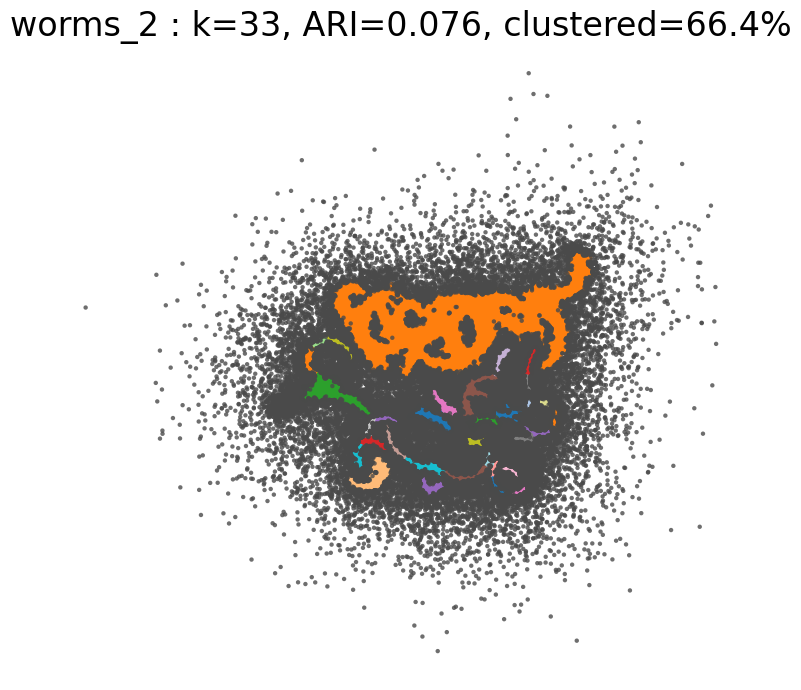



Processing: sipu worms_64
Synthetic 64D data with worm-like shapes

Source: S. Sieranoja and P. Fränti,
Fast and general density peaks clustering,
Pattern Recognition Letters, 128, 551-558, 2019.

Web: https://cs.joensuu.fi/sipu/datasets/

`labels0` come from the Authors.


Figures saved to: /content/figures/SIPU/


In [8]:
# ================================================================
# SIPU benchmark — mêmes couleurs pour y_true, HDBSCAN et Cech-triangles
# - On mappe les étiquettes prédites vers celles de la vérité terrain
#   avec CorrespClusterings, puis on utilise UNE palette partagée.
# ================================================================

import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import os

# Lisible et propre
mpl.rcParams.update({
    "figure.figsize": (8.0, 7.0),
    "savefig.dpi": 300,
    "axes.titlesize": 24,
    "axes.labelsize": 24,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,
})

# Palette vive et suffisamment longue
def _make_palette(k: int):
    tab10 = plt.cm.get_cmap("tab10").colors
    tab20 = plt.cm.get_cmap("tab20").colors
    base = list(tab10) + list(tab20)  # 30 couleurs vives avant recyclage
    if k <= len(base):
        return base[:k]
    out = []
    i = 0
    while len(out) < k:
        out.append(base[i % len(base)])
        i += 1
    return out

def _plot_with_shared_palette(X, y, palette, title, path):
    """Trace un scatter en utilisant la palette partagée.
       y: labels dans {-1, 0, 1, ..., K-1}, -1 = bruit."""
    fig, ax = plt.subplots()
    ax.set_facecolor("white")
    ax.axis("equal")

    y = np.asarray(y)
    noise_mask = (y == -1)
    # Clusters valides triés
    uniq = [int(c) for c in np.unique(y) if c != -1]

    # Clusters
    for ci in uniq:
        pts = (y == ci)
        if np.any(pts):
            ax.scatter(
                X[pts, 0], X[pts, 1],
                s=14, c=[palette[ci]], alpha=0.95,
                edgecolors="none", linewidths=0
            )

    # Bruit en gris foncé lisible
    if np.any(noise_mask):
        ax.scatter(
            X[noise_mask, 0], X[noise_mask, 1],
            s=10, c="#4a4a4a", alpha=0.8,
            edgecolors="none", linewidths=0
        )

    ax.set_xticks([]); ax.set_yticks([])
    for spine in ax.spines.values():
        spine.set_visible(False)

    ax.set_title(title)
    fig.tight_layout()
    fig.savefig(path, bbox_inches="tight")
    plt.show()
    plt.close(fig)

def _fmt_prop(p):
    return f"{100.0 * p:.1f}%"

# ================================================================
# Exécution SIPU avec palette partagée et mapping d'étiquettes
# ================================================================
if compute_SIPU_clusterings:
    print(clustbench.get_battery_names(path=data_path))

    battery = "sipu"
    Datasets = [(battery, dataset) for dataset in clustbench.get_dataset_names(battery, path=data_path)]

    for batt, dataset in Datasets:
        print("\n\nProcessing:", batt, dataset)
        b = clustbench.load_dataset(batt, dataset, path=data_path)
        print(b.description)

        M = b.data
        n, p1 = M.shape

        # On reste sur les 2D et on exclut les jeux ambigus
        if p1 == 2 and dataset not in ("compound", "flame", "pathbased", "r15"):
            M2 = np.copy(M)
            n, p = M2.shape

            # Seuil de percolation (min cluster size)
            PercolThreshold = int(round(np.sqrt(n)))
            print("PercolThreshold =", PercolThreshold)

            # ---------- Vérité terrain ----------
            y_true = b.labels[0]          # 1..k_true
            y_true0 = (y_true - 1)        # 0..k_true-1
            k_true = int(np.max(y_true0)) + 1

            # Palette partagée dimensionnée au moins à k_true
            palette = _make_palette(k_true)

            # Proportion "clustered" pour y_true est triviale (100%), on garde le titre simple
            _plot_with_shared_palette(
                M2, y_true0, palette,
                title=f"{dataset} : y_true, k={k_true}",
                path=os.path.join(folder_SIPU_results, f"{dataset}_y_true.png"),
            )

            # ---------- HDBSCAN ----------
            clusterer = hdbscan.HDBSCAN(min_cluster_size=PercolThreshold, min_samples=3)
            clusterer.fit(M2)
            labels_hdbscan = clusterer.labels_

            # ARI sur tout (y compris -1), proportion clusterisée
            ARI_hdbscan = round(adjusted_rand_score(y_true0, labels_hdbscan), 3)
            prop_hdbscan = float((labels_hdbscan != -1).mean())
            k_hdbscan = int(np.max(labels_hdbscan)) + 1 if np.any(labels_hdbscan != -1) else 0

            # Mapping des labels prédits vers l'espace 0..k_true-1 pour partager la palette
            labels_hdbscan_mapped = CorrespClusterings(y_true, (labels_hdbscan + 1)) - 1

            # Si le mapping exposait un label >= len(palette), on étend la palette
            max_needed = int(np.max(labels_hdbscan_mapped[labels_hdbscan_mapped != -1])) if np.any(labels_hdbscan_mapped != -1) else -1
            if max_needed + 1 > len(palette):
                palette = _make_palette(max_needed + 1)

            _plot_with_shared_palette(
                M2, labels_hdbscan_mapped, palette,
                title=f"{dataset} : k={k_hdbscan}, ARI={ARI_hdbscan}, clustered={_fmt_prop(prop_hdbscan)}",
                path=os.path.join(folder_SIPU_results, f"{dataset}_HDBSCAN.png"),
            )

            # ---------- Triangle connectivity (K=2) ----------
            labels_tri = ČechTrianglesComponents(M2, PercolThreshold=PercolThreshold, expZ=False, verbeux=True)
            ARI_tri = round(adjusted_rand_score(y_true0, labels_tri), 3)
            prop_tri = float((labels_tri != -1).mean())
            k_tri = int(np.max(labels_tri)) + 1 if np.any(labels_tri != -1) else 0

            labels_tri_mapped = CorrespClusterings(y_true, (labels_tri + 1)) - 1

            max_needed2 = int(np.max(labels_tri_mapped[labels_tri_mapped != -1])) if np.any(labels_tri_mapped != -1) else -1
            if max_needed2 + 1 > len(palette):
                palette = _make_palette(max_needed2 + 1)

            _plot_with_shared_palette(
                M2, labels_tri_mapped, palette,
                title=f"{dataset} : k={k_tri}, ARI={ARI_tri}, clustered={_fmt_prop(prop_tri)}",
                path=os.path.join(folder_SIPU_results, f"{dataset}_CechTriangles.png"),
            )

    print(f"\nFigures saved to: {folder_SIPU_results}")
